In [1]:
import pandas as pd
from CosinorPy import file_parser, cosinor, cosinor1
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
transcriptome = pd.read_csv(
    "/Users/michael/Data/Luke_terrace_experiment/General_data/plate1_5_tpm_normalized.csv",
    index_col=0,
)
rows_to_drop_expression_data = [
    "A2450525897_n01_undetermined",
    "A2449446903_n01_undetermined",
    "B250508004_n01_undetermined",
    "B2449500127_n01_undetermined",
]
transcriptome = transcriptome.drop(index=rows_to_drop_expression_data)
transcriptome = transcriptome.sort_index()
metadata = pd.read_csv(
    "/Users/michael/Data/Luke_terrace_experiment/General_data/Plates_1_to_5_metadata_merged_luke.csv",
    index_col=0,
)
metadata = metadata.drop(
    columns=[
        "arb.sort",
        "sample-id",
        "Ambiguous Unstranded",
        "Ambiguous Forward",
        "Multimapping",
        "Unmapped Over Mapped",
    ]
)
metadata["Date and Time"] = metadata["date"] + " " + metadata["time"]
luke_time_data_format = "%-m/%-d/%y %-H:%-M"
metadata["Date and Time"] = pd.to_datetime(
    metadata["Date and Time"], format=luke_time_data_format
)
unusable_samples = [
    "A2450525897_n01_LICRNA01_A06",
    "A2450525897_n01_LICRNA01_A08",
    "A2450525897_n01_LICRNA01_C11",
    "A2450525897_n01_LICRNA01_D11",
    "A2450525897_n01_LICRNA01_D12",
    "A2449446903_n01_LICRNA02_F01",
    "B2449500127_n01_LICRNA04_A04",
    "B2449500127_n01_LICRNA04_A06",
    "B2449500127_n01_LICRNA04_A07",
]
borderline_unusable = [
    "A2450525897_n01_LICRNA01_F03",
    "A2450525897_n01_LICRNA01_G07",
    "A2449446903_n01_LICRNA02_A04",
    "A2449446903_n01_LICRNA02_H10",
    "B2449500127_n01_LICRNA04_H02",
    "B2449500127_n01_LICRNA04_H11",
]
all_unsable = borderline_unusable + unusable_samples
# trimmed_transcriptome = transcriptome.drop(index=all_unsable)
# trimmed_metadata = metadata.drop(index=all_unsable)
## Get plate 5 samples and remove what they replaced from the metadata to avoid duplicates
plate_5_replacements = metadata.loc[metadata["rnaprepplate"] == "LICRNA_05"]
non_plate_5_samples = metadata.loc[metadata["rnaprepplate"] != "LICRNA_05"]
replaced_samples = non_plate_5_samples.loc[
    non_plate_5_samples["sampID"].isin(plate_5_replacements["sampID"])
]
trimmed_metadata = metadata.drop(index=replaced_samples.index)
### get duplicates and drop the one with higher total genes, so that we can drop everything from the main list
double_duplicates = (
    trimmed_metadata.loc[
        trimmed_metadata.duplicated(
            subset="sampID",
            keep=False,
        )
    ]
    .sort_values(by="Total Reads")
    .drop_duplicates(subset="sampID", keep="first")
)
trimmed_metadata = trimmed_metadata.drop(index=double_duplicates.index)
trimmed_metadata
trimmed_transcriptome = transcriptome.loc[trimmed_metadata.index]
trimmed_transcriptome

defense_gene_list = pd.read_csv(
    "/Users/michael/Data/Luke_terrace_experiment/General_data/Generated_data/load_correlated_defense_genes_union_GO_and_FLG.csv"
)

In [56]:
c1_sunrise = "6:56"
c1_sunset = "17:24"
c2_sunrise = "6:27"
c2_sunset = "17:49"

In [55]:
metadata.loc[metadata["timepoint"].str.contains("c2")]

,plate.pos,sampID,sample.type,timepoint,date,time,extractplate,rnaprepplate,Unmapped,No Feature,plate_row,plate_col,Total Reads,Experiment Type,Sample Month,daysincestart,Date and Time
filename,,,,,,,,,,,,,,,,,
B2449500127_n01_LICRNA04_A07,A07,LIC577,plant,c2_t01,3/1/24,20:00,LICCIRC_03,LICRNA_04,15115790.0,3109.0,A,7,369572.0,Circadian Experiment 2,March,121,2024-03-01 20:00:00
B2449500127_n01_LICRNA04_B07,B07,LIC578,plant,c2_t01,3/1/24,20:00,LICCIRC_03,LICRNA_04,1243371.0,155543.0,B,7,2378242.0,Circadian Experiment 2,March,121,2024-03-01 20:00:00
B2449500127_n01_LICRNA04_C07,C07,LIC579,plant,c2_t01,3/1/24,20:00,LICCIRC_03,LICRNA_04,2284290.0,248631.0,C,7,3407278.0,Circadian Experiment 2,March,121,2024-03-01 20:00:00
B2449500127_n01_LICRNA04_D07,D07,LIC580,plant,c2_t01,3/1/24,20:00,LICCIRC_03,LICRNA_04,3481386.0,373544.0,D,7,5716593.0,Circadian Experiment 2,March,121,2024-03-01 20:00:00
B2449500127_n01_LICRNA04_E07,E07,LIC581,plant,c2_t01,3/1/24,20:00,LICCIRC_03,LICRNA_04,1815897.0,275114.0,E,7,3997560.0,Circadian Experiment 2,March,121,2024-03-01 20:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
A2534491401_n01_LICRNA05_G07,G07,LIC751,plant,c2_t13,3/3/24,20:00,LICCIRC_04,LICRNA_05,5143951.0,410308.0,G,7,6626651.0,Circadian Experiment 2,March,123,2024-03-03 20:00:00
A2534491401_n01_LICRNA05_H07,H07,LIC752,plant,c2_t13,3/3/24,20:00,LICCIRC_04,LICRNA_05,5988350.0,442812.0,H,7,6451196.0,Circadian Experiment 2,March,123,2024-03-03 20:00:00
A2534491401_n01_LICRNA05_A10,A10,LIC577,plant,c2_t01,3/1/24,20:00,LICCIRC_03,LICRNA_05,13788449.0,3594.0,A,10,227017.0,Circadian Experiment 2,March,121,2024-03-01 20:00:00


In [3]:
arabi_go_matrix = pd.read_csv(
    "/Users/michael/Data/Reference_data/Arabdidopsis_go_matrix_from_tair_gaf.csv",
    index_col=0,
)
arabi_go_matrix
defense_terms = pd.read_csv(
    "/Users/michael/Data/Luke_terrace_experiment/General_data/Defense_go_terms.csv"
)

In [4]:
defense_terms

,GO Term ID,GO Term Description,Note
0,GO:0012501,programmed cell death,NaN
1,GO:0009626,Plant type hypersensitive response,NaN
2,GO:0042742,defense response to bacterium,NaN
3,GO:0071219,cellular response to molecule of bacterial origin,NaN
4,GO:0045087,innate immune response,NaN
5,GO:0009862,"systemic acquired resistance, salicylic acid m...",NaN
6,GO:0009861,jasmonic acid and ethylene-dependent systemic ...,NaN
7,GO:0034055,effector-mediated activation of host programme...,not enough genes
8,GO:0009682,induced systemic resistance,NaN
9,GO:0009626,plant-type hypersensitive response,NaN


In [59]:
immunity_terms = pd.read_csv(
    "/Users/michael/Data/Luke_terrace_experiment/General_data/Immunity_go_terms.csv"
)

In [5]:
luke_defense_genes = [
    "AT1G02920",
    "AT1G02930",
    "AT1G21110",
    "AT1G21120",
    "AT1G26380",
    "AT1G26410",
    "AT1G26420",
    "AT1G35230",
    "AT1G64170",
    "AT1G65500",
    "AT1G76930",
    "AT2G19190",
    "AT2G25470",
    "AT2G30750",
    "AT2G39200",
    "AT2G43620",
    "AT3G46280",
    "AT4G12490",
    "AT4G12500",
    "AT4G23140",
    "AT4G23220",
    "AT4G28420",
    "AT5G24110",
    "AT5G64120",
]

In [6]:
go_terms = defense_terms["GO Term ID"].unique()
only_defense_terms = arabi_go_matrix.loc[:, arabi_go_matrix.columns.isin(go_terms)]
full_defense_gene_list = only_defense_terms.loc[
    only_defense_terms.any(axis="columns")
].index.to_list()
print(len(full_defense_gene_list))
full_defense_gene_list = list(set(full_defense_gene_list) | set(luke_defense_genes))
print(len(full_defense_gene_list))

658
663


In [7]:
circadian_metadata = trimmed_metadata.loc[
    trimmed_metadata["Experiment Type"].str.contains("Circadian Experiment 1")
]
circadian_transcriptome = trimmed_transcriptome.loc[
    trimmed_metadata["Experiment Type"].str.contains("Circadian Experiment 1")
]
circadian_metadata["Time Since Start"] = (
    circadian_metadata["Date and Time"]
    - circadian_metadata.sort_values(by="Date and Time")["Date and Time"].iloc[0]
) / pd.Timedelta(hours=1)


circadian_metadata_2 = trimmed_metadata.loc[
    trimmed_metadata["Experiment Type"].str.contains("Circadian Experiment 2")
]
circadian_transcriptome_2 = trimmed_transcriptome.loc[
    trimmed_metadata["Experiment Type"].str.contains("Circadian Experiment 2")
]
circadian_metadata_2["Time Since Start"] = (
    circadian_metadata_2["Date and Time"]
    - circadian_metadata_2.sort_values(by="Date and Time")["Date and Time"].iloc[0]
) / pd.Timedelta(hours=1)

/var/folders/nk/6xkk9sgn1pz4ff1b36sfq3y40000gt/T/ipykernel_62193/272630936.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  circadian_metadata["Time Since Start"] = (
/var/folders/nk/6xkk9sgn1pz4ff1b36sfq3y40000gt/T/ipykernel_62193/272630936.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  circadian_metadata_2["Time Since Start"] = (


In [8]:
trimmed_circadian_transcriptome = circadian_transcriptome.merge(
    right=circadian_metadata[["timepoint", "Time Since Start"]],
    left_index=True,
    right_index=True,
)
trimmed_circadian_transcriptome = trimmed_circadian_transcriptome.set_index(
    "timepoint", append=False
)
trimmed_circadian_transcriptome

,AT1G01010,AT1G01020,AT1G03987,AT1G01030,AT1G01040,AT1G03993,AT1G01046,AT1G01050,AT1G03997,AT1G01060,...,ArthCr088,ArthCt112,ArthCp088,ArthCp086,ArthCt118,ArthCp083,ArthCt111,ArthCp084,ArthCp085,Time Since Start
timepoint,,,,,,,,,,,,,,,,,,,,,
c1_t01,0.397484,3.914962,0.0,0.528310,3.953698,0.0,0.0,40.794727,0.0,1.797838,...,7.125035,0.000000,0.000000,0.0,0.0,0.308596,0.0,0.000000,0.271092,0.0
c1_t01,0.242429,4.428221,0.0,0.644440,3.014240,0.0,0.0,17.650893,0.0,1.824204,...,4.528588,5.683607,5.465007,0.0,0.0,1.114433,0.0,0.000000,1.240060,0.0
c1_t01,1.673381,6.023319,0.0,1.853456,2.654170,0.0,0.0,54.553650,0.0,0.495411,...,4.262576,0.000000,5.130271,0.0,0.0,0.061540,0.0,0.000000,3.423839,0.0
c1_t01,0.306973,2.902550,0.0,0.054401,2.195151,0.0,0.0,36.827954,0.0,0.060587,...,4.239898,0.000000,0.442881,0.0,0.0,0.406409,0.0,0.000000,2.763579,0.0
c1_t01,0.731436,8.981825,0.0,0.185176,3.511319,0.0,0.0,34.519120,0.0,0.360907,...,2.484234,0.000000,4.145698,0.0,0.0,0.640452,0.0,0.000000,0.213795,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
c1_t13,0.000000,8.339930,0.0,7.860235,3.199519,0.0,0.0,39.201659,0.0,1.057777,...,4.602930,22.529946,1.333133,0.0,0.0,0.036247,0.0,4.867353,5.293749,48.0
c1_t09,0.000000,1.692107,0.0,1.577446,3.055581,0.0,0.0,29.564231,0.0,12.872063,...,6.899039,1.605254,3.951394,0.0,0.0,0.839348,0.0,0.000000,3.222183,32.0
c1_t04,0.641335,5.972190,0.0,1.641699,5.632121,0.0,0.0,48.940407,0.0,24.612749,...,7.502750,0.000000,1.799150,0.0,0.0,0.000000,0.0,0.000000,0.145801,12.0


In [9]:
trimmed_circadian_transcriptome_2 = circadian_transcriptome_2.merge(
    right=circadian_metadata_2[["timepoint", "Time Since Start"]],
    left_index=True,
    right_index=True,
)
trimmed_circadian_transcriptome_2 = trimmed_circadian_transcriptome_2.set_index(
    "timepoint", append=False
)
trimmed_circadian_transcriptome_2

,AT1G01010,AT1G01020,AT1G03987,AT1G01030,AT1G01040,AT1G03993,AT1G01046,AT1G01050,AT1G03997,AT1G01060,...,ArthCr088,ArthCt112,ArthCp088,ArthCp086,ArthCt118,ArthCp083,ArthCt111,ArthCp084,ArthCp085,Time Since Start
timepoint,,,,,,,,,,,,,,,,,,,,,
c2_t01,0.369734,5.032079,0.0,2.293318,1.259021,0.0,0.0,23.750115,0.0,0.243247,...,0.279057,14.446995,2.667137,0.0,0.0,0.030216,0.0,0.0,3.025989,0.0
c2_t01,0.000000,7.451890,0.0,2.867837,1.926605,0.0,0.0,23.558990,0.0,0.380231,...,1.832069,0.000000,5.280899,0.0,0.0,0.094464,0.0,0.0,1.892027,0.0
c2_t01,0.629969,6.656039,0.0,0.651243,2.907280,0.0,0.0,31.338727,0.0,2.745762,...,2.615081,0.000000,5.301787,0.0,0.0,0.025742,0.0,0.0,0.644477,0.0
c2_t01,0.402656,7.895757,0.0,2.854316,5.222927,0.0,0.0,37.193012,0.0,8.245217,...,2.849112,0.000000,5.809265,0.0,0.0,0.888476,0.0,0.0,6.384911,0.0
c2_t01,0.304598,4.418313,0.0,1.214553,5.117861,0.0,0.0,46.119998,0.0,2.630170,...,4.827800,0.000000,3.295902,0.0,0.0,0.000000,0.0,0.0,0.623225,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
c2_t13,0.620785,7.781875,0.0,2.872592,3.449003,0.0,0.0,33.680234,0.0,0.000000,...,8.589862,11.319746,3.731784,0.0,0.0,0.710259,0.0,0.0,7.197594,48.0
c2_t13,0.000000,2.561732,0.0,2.535106,2.600397,0.0,0.0,37.505886,0.0,0.470562,...,13.418790,0.000000,3.931116,0.0,0.0,0.217111,0.0,0.0,3.205647,48.0
c2_t01,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.293215,...,25.564923,0.000000,4.286696,0.0,0.0,0.000000,0.0,0.0,64.440730,0.0


In [10]:
merged_by_timepoint_circadian_transcriptome = trimmed_circadian_transcriptome.groupby(
    "timepoint"
).mean()
merged_by_timepoint_circadian_transcriptome

,AT1G01010,AT1G01020,AT1G03987,AT1G01030,AT1G01040,AT1G03993,AT1G01046,AT1G01050,AT1G03997,AT1G01060,...,ArthCr088,ArthCt112,ArthCp088,ArthCp086,ArthCt118,ArthCp083,ArthCt111,ArthCp084,ArthCp085,Time Since Start
timepoint,,,,,,,,,,,,,,,,,,,,,
c1_t01,0.537904,5.951338,0.0,1.940228,3.148396,0.0,0.000000,31.201111,0.000000,1.063178,...,5.116946,0.710451,3.043686,0.0,0.0,0.412291,0.0,0.000000,2.297625,0.0
c1_t02,1.476474,5.358225,0.0,1.498052,2.882145,0.0,0.239297,29.949714,0.000000,3.530612,...,5.335848,4.928663,4.365356,0.0,0.0,0.404082,0.0,0.000000,2.166721,4.0
c1_t03,1.153669,5.999800,0.0,1.812127,3.487374,0.0,0.000000,37.833377,0.000000,11.937175,...,3.832741,4.687911,3.201531,0.0,0.0,0.364968,0.0,0.000000,2.847598,8.0
c1_t04,0.559132,4.865199,0.0,2.088175,3.345267,0.0,0.000000,34.967377,0.000000,15.497050,...,4.446323,4.448165,3.433265,0.0,0.0,0.412008,0.0,0.000000,1.653954,12.0
c1_t05,0.771969,4.868313,0.0,1.280354,2.757246,0.0,0.000000,32.050421,0.000000,7.480780,...,6.461871,6.688622,5.253620,0.0,0.0,0.227474,0.0,0.237020,3.705129,16.0
c1_t06,0.512436,5.322230,0.0,1.395029,2.679409,0.0,0.000000,36.018233,0.033458,0.804330,...,5.094827,0.756887,2.786559,0.0,0.0,0.302136,0.0,0.000000,1.745792,20.0
c1_t07,0.752485,5.785683,0.0,1.186666,3.548397,0.0,0.000000,44.002670,0.000000,0.358735,...,4.974461,4.227200,2.223456,0.0,0.0,0.358217,0.0,0.186116,2.069895,24.0
c1_t08,0.660199,6.177843,0.0,1.426387,3.274844,0.0,0.000000,35.101527,0.000000,1.097545,...,5.653718,4.119020,4.715959,0.0,0.0,0.357451,0.0,0.438708,2.175584,28.0
c1_t09,1.054015,5.800128,0.0,1.418720,3.255234,0.0,0.000000,34.428704,0.000000,15.921169,...,4.666604,0.200657,2.095402,0.0,0.0,0.263480,0.0,0.000000,1.970292,32.0


In [11]:
cosinor_formatted_circadian_transcriptome = trimmed_circadian_transcriptome.melt(
    id_vars="Time Since Start", var_name="Gene", value_name="y"
)
cosinor_formatted_circadian_transcriptome = (
    cosinor_formatted_circadian_transcriptome.rename(
        columns={"Gene": "test", "Time Since Start": "x"}
    )
)
cosinor_formatted_circadian_transcriptome = cosinor_formatted_circadian_transcriptome[
    ["test", "x", "y"]
]
cosinor_formatted_circadian_transcriptome

,test,x,y
0,AT1G01010,0.0,0.397484
1,AT1G01010,0.0,0.242429
2,AT1G01010,0.0,1.673381
3,AT1G01010,0.0,0.306973
4,AT1G01010,0.0,0.731436
...,...,...,...
3982675,ArthCp085,48.0,5.293749
3982676,ArthCp085,32.0,3.222183
3982677,ArthCp085,12.0,0.145801
3982678,ArthCp085,32.0,3.821523


In [12]:
cosinor_formatted_circadian_transcriptome_2 = trimmed_circadian_transcriptome_2.melt(
    id_vars="Time Since Start", var_name="Gene", value_name="y"
)
cosinor_formatted_circadian_transcriptome_2 = (
    cosinor_formatted_circadian_transcriptome_2.rename(
        columns={"Gene": "test", "Time Since Start": "x"}
    )
)
cosinor_formatted_circadian_transcriptome_2 = (
    cosinor_formatted_circadian_transcriptome_2[["test", "x", "y"]]
)
cosinor_formatted_circadian_transcriptome_2

,test,x,y
0,AT1G01010,0.0,0.369734
1,AT1G01010,0.0,0.000000
2,AT1G01010,0.0,0.629969
3,AT1G01010,0.0,0.402656
4,AT1G01010,0.0,0.304598
...,...,...,...
3982675,ArthCp085,48.0,7.197594
3982676,ArthCp085,48.0,3.205647
3982677,ArthCp085,0.0,64.440730
3982678,ArthCp085,16.0,3.510440


In [13]:
cosinor_gene_results_2 = pd.read_csv(
    "/Users/michael/Data/Luke_terrace_experiment/Output_for_Luke/Gene_cosine_results_circadian_experiment_2_more_genes.csv"
)

In [14]:
cosinor_gene_results = pd.read_csv(
    "/Users/michael/Data/Luke_terrace_experiment/Output_for_Luke/Gene_cosine_results_circadian_experiment_1_more_genes.csv"
)

In [15]:
cosinor_gene_results

,test,period,p,q,amplitude,p(amplitude),q(amplitude),CI(amplitude),acrophase,p(acrophase),q(acrophase),CI(acrophase),acrophase[h]
0,AT1G01010,24.0,0.030610,0.075153,0.304750,0.007246,0.017809,"[np.float64(0.08231761601465115), np.float64(0...",-1.818515,1.988479e-07,0.000001,"[np.float64(-2.5038884551704794), np.float64(-...",6.946216
1,AT1G01020,24.0,0.238275,0.353689,0.586045,0.088690,0.131580,"[np.float64(-0.08868511701801962), np.float64(...",-1.021486,7.243576e-02,0.132849,"[np.float64(-2.135998950246445), np.float64(0....",3.901791
2,AT1G01030,24.0,0.487253,0.595060,0.275275,0.229475,0.280287,"[np.float64(-0.17369128570149883), np.float64(...",-2.721103,1.822102e-03,0.005077,"[np.float64(-4.431691406310053), np.float64(-1...",10.393846
3,AT1G01040,24.0,0.615459,0.703253,0.216200,0.323327,0.369620,"[np.float64(-0.21284555721290419), np.float64(...",-1.545620,1.010884e-01,0.176070,"[np.float64(-3.3932402642839676), np.float64(0...",5.903832
4,AT1G01050,24.0,0.527534,0.630539,1.667916,0.256990,0.307238,"[np.float64(-1.2160351491113726), np.float64(4...",1.888379,2.336770e-02,0.050332,"[np.float64(0.256022226993742), np.float64(3.5...",16.786924
...,...,...,...,...,...,...,...,...,...,...,...,...,...
17233,ArthCt124,24.0,0.437745,0.550431,1.003385,0.196830,0.247544,"[np.float64(-0.520358399861591), np.float64(2....",-3.092340,2.017680e-04,0.000670,"[np.float64(-4.723013535374932), np.float64(-1...",11.811869
17234,ArthCr088,24.0,0.983939,0.988123,0.080335,0.857185,0.860830,"[np.float64(-0.7946092780222602), np.float64(0...",0.067684,9.909469e-01,0.994531,"[np.float64(-11.62364521056486), np.float64(11...",23.741468
17235,ArthCt112,24.0,0.883223,0.916175,0.422995,0.618020,0.641116,"[np.float64(-1.2395749960550184), np.float64(2...",-3.131002,1.460804e-01,0.239568,"[np.float64(-7.352936023155259), np.float64(1....",11.959546
17236,ArthCp088,24.0,0.213587,0.327127,0.718297,0.076878,0.117776,"[np.float64(-0.07749652534499762), np.float64(...",-2.832559,2.274418e-06,0.000010,"[np.float64(-4.006934921937825), np.float64(-1...",10.819579


In [16]:
defense_gene_list

,gene
0,AT1G01100
1,AT1G01230
2,AT1G04510
3,AT1G07360
4,AT1G08450
...,...
194,AT5G64810
195,AT5G65200
196,AT5G67300
197,AT5G67330


In [17]:
circ_1_results = cosinor_gene_results.loc[
    cosinor_gene_results["test"].isin(defense_gene_list["gene"])
][["test", "p", "amplitude", "acrophase", "acrophase[h]"]]


circ_2_results = cosinor_gene_results_2.loc[
    cosinor_gene_results_2["test"].isin(defense_gene_list["gene"])
][["test", "p", "amplitude", "acrophase", "acrophase[h]"]]

circ_2_results = circ_2_results.rename(
    columns={
        "amplitude": "amplitude_2",
        "acrophase": "acrophase_2",
        "p": "p_2",
        "acrophase[h]": "acrophase_2[h]",
    },
)

In [18]:
circ_1_results

,test,p,amplitude,acrophase,acrophase[h]
9,AT1G01100,0.923110,8.640992,1.389628,18.692014
22,AT1G01230,0.162148,1.802583,-0.720695,2.752852
264,AT1G04510,0.023725,2.033988,-2.798760,10.690477
466,AT1G07360,0.031325,2.254747,-1.531530,5.850014
553,AT1G08450,0.000311,6.548918,-1.520350,5.807308
...,...,...,...,...,...
16872,AT5G64810,0.065054,1.004552,-1.191422,4.550898
16903,AT5G65200,0.056074,0.429019,-0.529258,2.021618
17073,AT5G67300,0.030963,3.391299,0.929511,20.449529
17075,AT5G67330,0.108075,0.903208,0.344773,22.683064


In [19]:
merged_results_present_both_samples = circ_1_results.merge(
    right=circ_2_results,
    left_on="test",
    right_on="test",
    how="inner",
)
merged_results_present_both_samples

,test,p,amplitude,acrophase,acrophase[h],p_2,amplitude_2,acrophase_2,acrophase_2[h]
0,AT1G01100,0.923110,8.640992,1.389628,18.692014,0.001340,110.563252,-0.971575,3.711144
1,AT1G01230,0.162148,1.802583,-0.720695,2.752852,0.036554,4.160098,-1.234634,4.715953
2,AT1G04510,0.023725,2.033988,-2.798760,10.690477,0.007475,13.036483,-1.305189,4.985455
3,AT1G07360,0.031325,2.254747,-1.531530,5.850014,0.153469,5.549887,-1.347641,5.147609
4,AT1G08450,0.000311,6.548918,-1.520350,5.807308,0.002796,15.733476,-0.493126,1.883601
...,...,...,...,...,...,...,...,...,...
187,AT5G64810,0.065054,1.004552,-1.191422,4.550898,0.177863,2.047707,-0.570574,2.179432
188,AT5G65200,0.056074,0.429019,-0.529258,2.021618,0.826036,0.104637,-1.676820,6.404982
189,AT5G67300,0.030963,3.391299,0.929511,20.449529,0.004946,4.663551,-1.703556,6.507104
190,AT5G67330,0.108075,0.903208,0.344773,22.683064,0.202238,1.059652,-1.223199,4.672278


In [20]:
merged_results_present_both_samples = merged_results_present_both_samples.loc[
    merged_results_present_both_samples["p"] < 1e-6
]
merged_results_present_both_samples
merged_results_present_both_samples["Delta Amplitude"] = (
    merged_results_present_both_samples["amplitude"]
    - merged_results_present_both_samples["amplitude_2"]
)

/var/folders/nk/6xkk9sgn1pz4ff1b36sfq3y40000gt/T/ipykernel_62193/195263360.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  merged_results_present_both_samples["Delta Amplitude"] = (


In [21]:
merged_results_present_both_samples

,test,p,amplitude,acrophase,acrophase[h],p_2,amplitude_2,acrophase_2,acrophase_2[h],Delta Amplitude
12,AT1G22885,1.955813e-09,17.873090,-1.511684,5.774209,2.550484e-01,6.307221,-0.658024,2.513465,11.565869
14,AT1G25275,1.242004e-14,237.337766,-0.853293,3.259341,1.424195e-06,423.017075,-0.463628,1.770929,-185.679309
22,AT1G33970,9.544894e-09,1.622665,0.672822,21.430009,4.928003e-02,0.754828,0.958264,20.339700,0.867837
43,AT2G03440,7.232597e-07,26.756666,0.279466,22.932517,5.552895e-03,19.646080,1.257116,19.198171,7.110586
56,AT2G27050,5.590524e-08,2.604745,-0.716895,2.738339,4.462415e-02,2.093655,-0.911316,3.480970,0.511091
59,AT2G32800,6.888548e-07,1.090747,-0.739907,2.826237,1.720755e-02,0.904902,-0.872634,3.333218,0.185845
63,AT2G36750,6.451873e-11,2.612333,1.716369,17.443955,5.971529e-01,0.437843,2.503742,14.436409,2.174490
70,AT2G43710,3.237184e-12,19.624511,3.022350,12.455474,1.378773e-08,22.770427,-2.202751,8.413889,-3.145916
72,AT2G44490,7.019442e-08,14.861016,0.385361,22.528029,6.519786e-05,12.845715,1.100765,19.795388,2.015301
98,AT3G49780,1.210186e-08,8.070202,-1.009992,3.857883,1.558525e-04,20.082709,-0.871816,3.330091,-12.012507


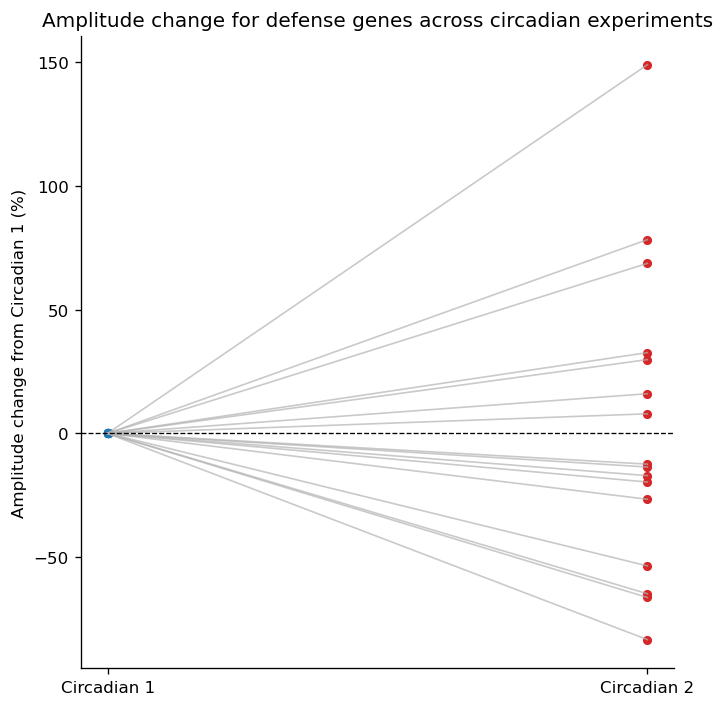

In [22]:
paired_amplitude_plot_data = (
    merged_results_present_both_samples[["test", "amplitude", "amplitude_2"]]
    .dropna()
    .loc[lambda df: df["amplitude"] > 0]
    .copy()
)

paired_amplitude_plot_data["amplitude_change_percent"] = 0.0
paired_amplitude_plot_data["amplitude_2_change_percent"] = (
    (
        paired_amplitude_plot_data["amplitude_2"]
        - paired_amplitude_plot_data["amplitude"]
    )
    / paired_amplitude_plot_data["amplitude"]
    * 100
)
paired_amplitude_plot_data = paired_amplitude_plot_data.sort_values(
    by="amplitude_2_change_percent"
)

fig, ax = plt.subplots(
    figsize=(6, max(6, len(paired_amplitude_plot_data) * 0.18)), dpi=120
)

for row in paired_amplitude_plot_data.itertuples(index=False):
    ax.plot(
        [0, 1],
        [row.amplitude_change_percent, row.amplitude_2_change_percent],
        color="0.7",
        alpha=0.7,
        linewidth=1,
    )
    ax.scatter(0, row.amplitude_change_percent, color="#1f77b4", s=20)
    ax.scatter(1, row.amplitude_2_change_percent, color="#d62728", s=20)

ax.axhline(0, color="black", linewidth=0.8, linestyle="--")
ax.set_xticks([0, 1], ["Circadian 1", "Circadian 2"])
ax.set_ylabel("Amplitude change from Circadian 1 (%)")
ax.set_title("Amplitude change for defense genes across circadian experiments")

sns.despine()
plt.tight_layout()
plt.show()

In [23]:
paired_amplitude_plot_data["amplitude_2_change_percent"].median()

np.float64(-12.982262761571466)

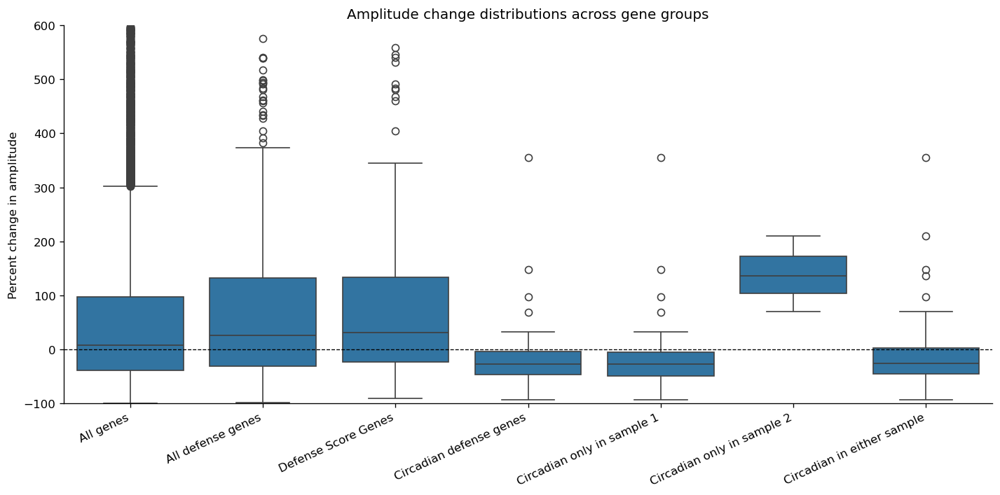

In [24]:
all_circ_1_results = cosinor_gene_results[["test", "p", "amplitude"]]

all_circ_2_results = cosinor_gene_results_2[["test", "p", "amplitude"]].rename(
    columns={"p": "p_2", "amplitude": "amplitude_2"}
)

merged_all_gene_results = all_circ_1_results.merge(
    all_circ_2_results, on="test", how="inner"
)
merged_all_gene_results = merged_all_gene_results.loc[
    merged_all_gene_results["amplitude"] > 0
].copy()
merged_all_gene_results["percent_change_in_amplitude"] = (
    (merged_all_gene_results["amplitude_2"] - merged_all_gene_results["amplitude"])
    / merged_all_gene_results["amplitude"]
    * 100
)

circadian_threshold = 1e-6
defense_mask = merged_all_gene_results["test"].isin(full_defense_gene_list)
defense_score_mask = merged_all_gene_results["test"].isin(defense_gene_list["gene"])
sample1_circadian_mask = merged_all_gene_results["p"] < circadian_threshold
sample2_circadian_mask = merged_all_gene_results["p_2"] < circadian_threshold

group_order = [
    "All genes",
    "All defense genes",
    "Defense Score Genes",
    "Circadian defense genes",
    "Circadian only in sample 1",
    "Circadian only in sample 2",
    "Circadian in either sample",
]

violin_plot_data = pd.concat(
    [
        merged_all_gene_results[["test", "percent_change_in_amplitude"]].assign(
            Group="All genes"
        ),
        merged_all_gene_results.loc[
            defense_mask,
            ["test", "percent_change_in_amplitude"],
        ].assign(Group="All defense genes"),
        merged_all_gene_results.loc[
            defense_score_mask,
            ["test", "percent_change_in_amplitude"],
        ].assign(Group="Defense Score Genes"),
        merged_all_gene_results.loc[
            defense_mask & sample1_circadian_mask,
            ["test", "percent_change_in_amplitude"],
        ].assign(Group="Circadian defense genes"),
        merged_all_gene_results.loc[
            defense_mask & sample1_circadian_mask & ~sample2_circadian_mask,
            ["test", "percent_change_in_amplitude"],
        ].assign(Group="Circadian only in sample 1"),
        merged_all_gene_results.loc[
            defense_mask & ~sample1_circadian_mask & sample2_circadian_mask,
            ["test", "percent_change_in_amplitude"],
        ].assign(Group="Circadian only in sample 2"),
        merged_all_gene_results.loc[
            defense_mask & (sample1_circadian_mask | sample2_circadian_mask),
            ["test", "percent_change_in_amplitude"],
        ].assign(Group="Circadian in either sample"),
    ],
    ignore_index=True,
)

fig, ax = plt.subplots(figsize=(12, 6), dpi=120)
sns.boxplot(
    data=violin_plot_data,
    x="Group",
    y="percent_change_in_amplitude",
    order=group_order,
    ax=ax,
)
ax.axhline(0, color="black", linewidth=0.8, linestyle="--")
ax.set_ylabel("Percent change in amplitude")
ax.set_xlabel("")
ax.set_title("Amplitude change distributions across gene groups")
plt.xticks(rotation=25, ha="right")
plt.ylim(-100, 600)
sns.despine()
plt.tight_layout()
plt.show()

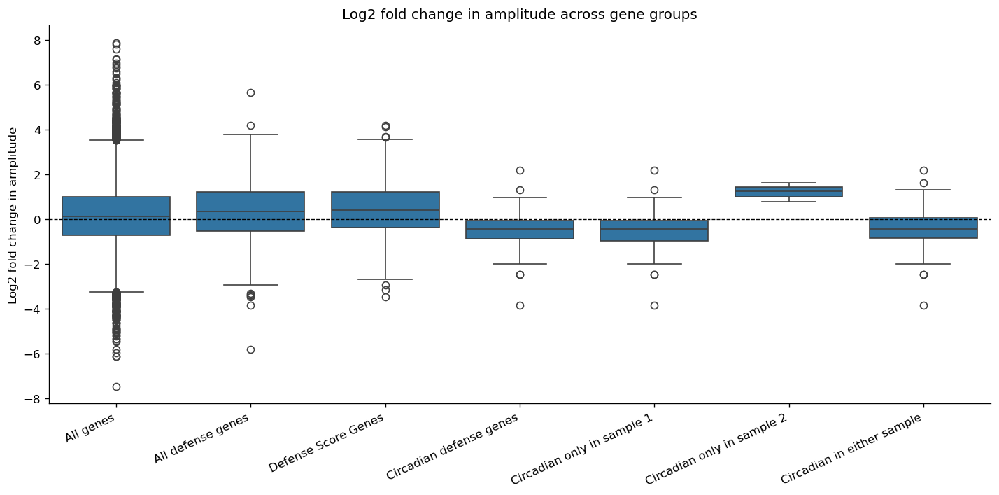

In [25]:
log2_merged_all_gene_results = all_circ_1_results.merge(
    all_circ_2_results, on="test", how="inner"
)
log2_merged_all_gene_results = log2_merged_all_gene_results.loc[
    (log2_merged_all_gene_results["amplitude"] > 0)
    & (log2_merged_all_gene_results["amplitude_2"] > 0)
].copy()
log2_merged_all_gene_results["log2_fold_change_in_amplitude"] = np.log2(
    log2_merged_all_gene_results["amplitude_2"]
    / log2_merged_all_gene_results["amplitude"]
)

circadian_threshold = 1e-6
log2_defense_mask = log2_merged_all_gene_results["test"].isin(full_defense_gene_list)
log2_defense_score_mask = log2_merged_all_gene_results["test"].isin(
    defense_gene_list["gene"]
)
log2_sample1_circadian_mask = log2_merged_all_gene_results["p"] < circadian_threshold
log2_sample2_circadian_mask = log2_merged_all_gene_results["p_2"] < circadian_threshold

log2_group_order = [
    "All genes",
    "All defense genes",
    "Defense Score Genes",
    "Circadian defense genes",
    "Circadian only in sample 1",
    "Circadian only in sample 2",
    "Circadian in either sample",
]

log2_boxplot_data = pd.concat(
    [
        log2_merged_all_gene_results[["test", "log2_fold_change_in_amplitude"]].assign(
            Group="All genes"
        ),
        log2_merged_all_gene_results.loc[
            log2_defense_mask,
            ["test", "log2_fold_change_in_amplitude"],
        ].assign(Group="All defense genes"),
        log2_merged_all_gene_results.loc[
            log2_defense_score_mask,
            ["test", "log2_fold_change_in_amplitude"],
        ].assign(Group="Defense Score Genes"),
        log2_merged_all_gene_results.loc[
            log2_defense_mask & log2_sample1_circadian_mask,
            ["test", "log2_fold_change_in_amplitude"],
        ].assign(Group="Circadian defense genes"),
        log2_merged_all_gene_results.loc[
            log2_defense_mask
            & log2_sample1_circadian_mask
            & ~log2_sample2_circadian_mask,
            ["test", "log2_fold_change_in_amplitude"],
        ].assign(Group="Circadian only in sample 1"),
        log2_merged_all_gene_results.loc[
            log2_defense_mask
            & ~log2_sample1_circadian_mask
            & log2_sample2_circadian_mask,
            ["test", "log2_fold_change_in_amplitude"],
        ].assign(Group="Circadian only in sample 2"),
        log2_merged_all_gene_results.loc[
            log2_defense_mask
            & (log2_sample1_circadian_mask | log2_sample2_circadian_mask),
            ["test", "log2_fold_change_in_amplitude"],
        ].assign(Group="Circadian in either sample"),
    ],
    ignore_index=True,
)

fig, ax = plt.subplots(figsize=(12, 6), dpi=120)
sns.boxplot(
    data=log2_boxplot_data,
    x="Group",
    y="log2_fold_change_in_amplitude",
    order=log2_group_order,
    ax=ax,
)
ax.axhline(0, color="black", linewidth=0.8, linestyle="--")
ax.set_ylabel("Log2 fold change in amplitude")
ax.set_xlabel("")
ax.set_title("Log2 fold change in amplitude across gene groups")
plt.xticks(rotation=25, ha="right")
sns.despine()
plt.tight_layout()
plt.show()

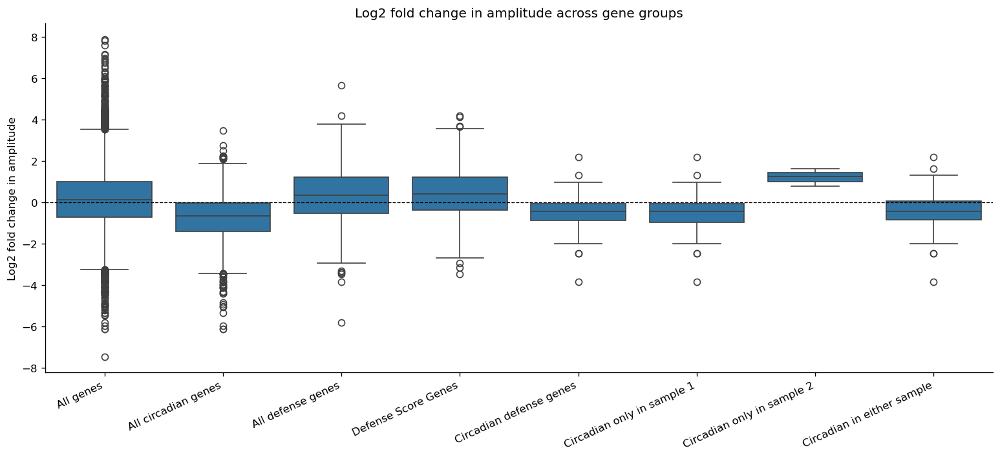

In [26]:
log2_merged_all_gene_results = all_circ_1_results.merge(
    all_circ_2_results, on="test", how="inner"
)
log2_merged_all_gene_results = log2_merged_all_gene_results.loc[
    (log2_merged_all_gene_results["amplitude"] > 0)
    & (log2_merged_all_gene_results["amplitude_2"] > 0)
].copy()
log2_merged_all_gene_results["log2_fold_change_in_amplitude"] = np.log2(
    log2_merged_all_gene_results["amplitude_2"]
    / log2_merged_all_gene_results["amplitude"]
)

circadian_threshold = 1e-6
log2_defense_mask = log2_merged_all_gene_results["test"].isin(full_defense_gene_list)
log2_defense_score_mask = log2_merged_all_gene_results["test"].isin(
    defense_gene_list["gene"]
)
log2_sample1_circadian_mask = log2_merged_all_gene_results["p"] < circadian_threshold
log2_sample2_circadian_mask = log2_merged_all_gene_results["p_2"] < circadian_threshold

log2_group_order = [
    "All genes",
    "All circadian genes",
    "All defense genes",
    "Defense Score Genes",
    "Circadian defense genes",
    "Circadian only in sample 1",
    "Circadian only in sample 2",
    "Circadian in either sample",
]

log2_boxplot_data = pd.concat(
    [
        log2_merged_all_gene_results[["test", "log2_fold_change_in_amplitude"]].assign(
            Group="All genes"
        ),
        log2_merged_all_gene_results.loc[
            log2_sample1_circadian_mask,
            ["test", "log2_fold_change_in_amplitude"],
        ].assign(Group="All circadian genes"),
        log2_merged_all_gene_results.loc[
            log2_defense_mask,
            ["test", "log2_fold_change_in_amplitude"],
        ].assign(Group="All defense genes"),
        log2_merged_all_gene_results.loc[
            log2_defense_score_mask,
            ["test", "log2_fold_change_in_amplitude"],
        ].assign(Group="Defense Score Genes"),
        log2_merged_all_gene_results.loc[
            log2_defense_mask & log2_sample1_circadian_mask,
            ["test", "log2_fold_change_in_amplitude"],
        ].assign(Group="Circadian defense genes"),
        log2_merged_all_gene_results.loc[
            log2_defense_mask
            & log2_sample1_circadian_mask
            & ~log2_sample2_circadian_mask,
            ["test", "log2_fold_change_in_amplitude"],
        ].assign(Group="Circadian only in sample 1"),
        log2_merged_all_gene_results.loc[
            log2_defense_mask
            & ~log2_sample1_circadian_mask
            & log2_sample2_circadian_mask,
            ["test", "log2_fold_change_in_amplitude"],
        ].assign(Group="Circadian only in sample 2"),
        log2_merged_all_gene_results.loc[
            log2_defense_mask
            & (log2_sample1_circadian_mask | log2_sample2_circadian_mask),
            ["test", "log2_fold_change_in_amplitude"],
        ].assign(Group="Circadian in either sample"),
    ],
    ignore_index=True,
)

fig, ax = plt.subplots(figsize=(13, 6), dpi=120)
sns.boxplot(
    data=log2_boxplot_data,
    x="Group",
    y="log2_fold_change_in_amplitude",
    order=log2_group_order,
    ax=ax,
)
ax.axhline(0, color="black", linewidth=0.8, linestyle="--")
ax.set_ylabel("Log2 fold change in amplitude")
ax.set_xlabel("")
ax.set_title("Log2 fold change in amplitude across gene groups")
plt.xticks(rotation=25, ha="right")
sns.despine()
plt.tight_layout()
plt.show()

In [27]:
merged_results_present_both_samples[
    (
        merged_results_present_both_samples["p"]
        + merged_results_present_both_samples["p_2"]
    )
    < 0.001
]

,test,p,amplitude,acrophase,acrophase[h],p_2,amplitude_2,acrophase_2,acrophase_2[h],Delta Amplitude
14,AT1G25275,1.242004e-14,237.337766,-0.853293,3.259341,1.424195e-06,423.017075,-0.463628,1.770929,-185.679309
70,AT2G43710,3.237184e-12,19.624511,3.022350,12.455474,1.378773e-08,22.770427,-2.202751,8.413889,-3.145916
72,AT2G44490,7.019442e-08,14.861016,0.385361,22.528029,6.519786e-05,12.845715,1.100765,19.795388,2.015301
98,AT3G49780,1.210186e-08,8.070202,-1.009992,3.857883,1.558525e-04,20.082709,-0.871816,3.330091,-12.012507
155,AT5G15870,1.381838e-10,4.723236,-1.511954,5.775240,1.801338e-04,7.966289,-0.947590,3.619526,-3.243053
165,AT5G43760,3.295815e-08,13.298368,-0.984329,3.759858,3.684711e-05,11.648901,-1.451819,5.545541,1.649468


<Axes: xlabel='amplitude', ylabel='Count'>

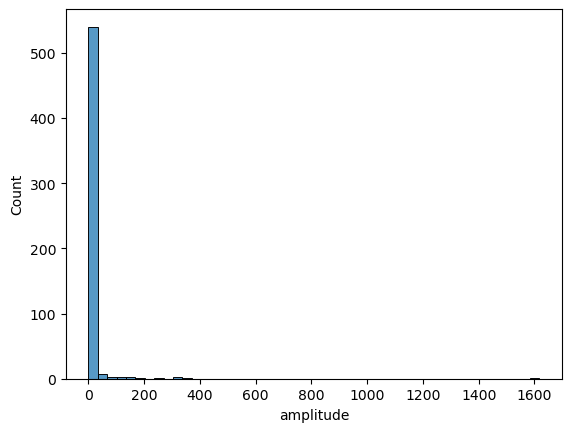

In [28]:
sns.histplot(
    cosinor_gene_results.loc[cosinor_gene_results["test"].isin(full_defense_gene_list)][
        "amplitude"
    ]
)

In [29]:
def plot_single_gene_cosinor(gene_name):
    single_gene_data = cosinor_formatted_circadian_transcriptome.loc[
        cosinor_formatted_circadian_transcriptome["test"] == gene_name
    ]
    results = cosinor1.fit_group(single_gene_data, period=[24], plot_on=True)
    print(results)

In [30]:
cosinor_gene_results.sort_values(by="q").head(20)

,test,period,p,q,amplitude,p(amplitude),q(amplitude),CI(amplitude),acrophase,p(acrophase),q(acrophase),CI(acrophase),acrophase[h]
4725,AT2G05100,24.0,6.887979e-35,1.187350e-30,269.029092,6.598379e-84,1.137429e-79,"[np.float64(241.86060680400522), np.float64(29...",2.469336,0.000000e+00,0.000000e+00,"[np.float64(2.366717489048801), np.float64(2.5...",14.567830
4724,AT2G05070,24.0,2.599396e-31,2.240420e-27,714.202543,2.864151e-68,2.468611e-64,"[np.float64(634.0323719753828), np.float64(794...",2.240138,0.000000e+00,0.000000e+00,"[np.float64(2.1297165487640037), np.float64(2....",15.443302
14126,AT5G15850,24.0,7.926097e-31,4.554335e-27,32.659200,2.435000e-66,1.399151e-62,"[np.float64(28.938724135756566), np.float64(36...",-2.243839,0.000000e+00,0.000000e+00,"[np.float64(-2.3559581628936375), np.float64(-...",8.570833
5815,AT2G30520,24.0,2.359240e-30,1.016715e-26,31.533307,1.748717e-64,7.536097e-61,"[np.float64(27.88825620489714), np.float64(35....",-2.288899,0.000000e+00,0.000000e+00,"[np.float64(-2.403389520327261), np.float64(-2...",8.742948
3753,AT1G70820,24.0,7.168879e-30,2.471543e-26,18.771798,8.310803e-63,2.865233e-59,"[np.float64(16.572258148521325), np.float64(20...",1.199800,2.467911e-99,2.376640e-97,"[np.float64(1.088642447117776), np.float64(1.3...",19.417102
11323,AT4G15430,24.0,4.300807e-29,1.235622e-25,5.514022,9.317129e-60,2.676811e-56,"[np.float64(4.851141500484977), np.float64(6.1...",-2.400427,0.000000e+00,0.000000e+00,"[np.float64(-2.521404850818482), np.float64(-2...",9.168954
12507,AT4G32340,24.0,7.454304e-29,1.835676e-25,26.091338,6.554568e-59,1.614109e-55,"[np.float64(22.93151922321922), np.float64(29....",0.653486,3.034215e-25,5.225155e-24,"[np.float64(0.5301028372553727), np.float64(0....",21.503867
9884,AT3G54500,24.0,3.878664e-28,8.357551e-25,6.889717,1.267195e-56,2.730489e-53,"[np.float64(6.038105515517541), np.float64(7.7...",-3.054478,0.000000e+00,0.000000e+00,"[np.float64(-3.187107808565752), np.float64(-2...",11.667245
453,AT1G07180,24.0,6.826598e-28,1.307521e-24,15.837220,1.631488e-55,3.124844e-52,"[np.float64(13.859519988960994), np.float64(17...",2.464237,0.000000e+00,0.000000e+00,"[np.float64(2.337432521994469), np.float64(2.5...",14.587310
15568,AT5G45820,24.0,1.644938e-27,2.835544e-24,6.952742,2.388549e-54,4.117381e-51,"[np.float64(6.074929269757245), np.float64(7.8...",2.783110,0.000000e+00,0.000000e+00,"[np.float64(2.649864588686417), np.float64(2.9...",13.369303


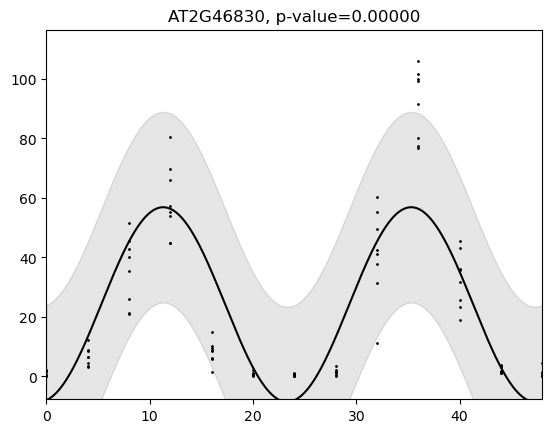

        test  period             p             q  amplitude  p(amplitude)  \
0  AT2G46830    24.0  6.126988e-27  6.126988e-27  32.724123  1.638059e-52   

   q(amplitude)                             CI(amplitude)  acrophase  \
0  1.638059e-52  [28.518436420873265, 36.929809416163714]  -2.960204   

   p(acrophase)  q(acrophase)                              CI(acrophase)  \
0           0.0           0.0  [-3.0976128399419736, -2.822795498996178]   

   acrophase[h]  
0     11.307147  


In [31]:
plot_single_gene_cosinor("AT2G46830")

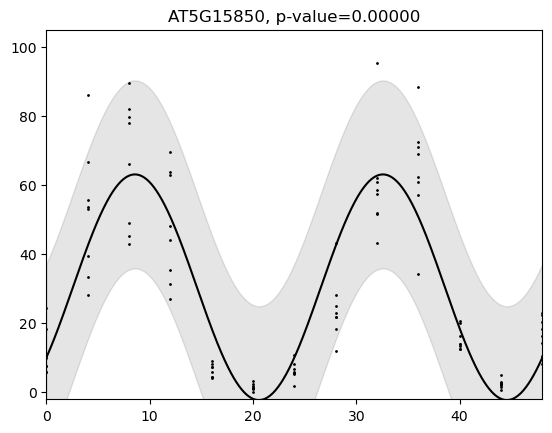

        test  period             p             q  amplitude  p(amplitude)  \
0  AT5G15850    24.0  7.926097e-31  7.926097e-31    32.6592  2.435000e-66   

   q(amplitude)                             CI(amplitude)  acrophase  \
0  2.435000e-66  [28.938724135756566, 36.379675943355046]  -2.243839   

   p(acrophase)  q(acrophase)                              CI(acrophase)  \
0           0.0           0.0  [-2.3559581628936375, -2.131719698420186]   

   acrophase[h]  
0      8.570833  


In [32]:
plot_single_gene_cosinor("AT5G15850")

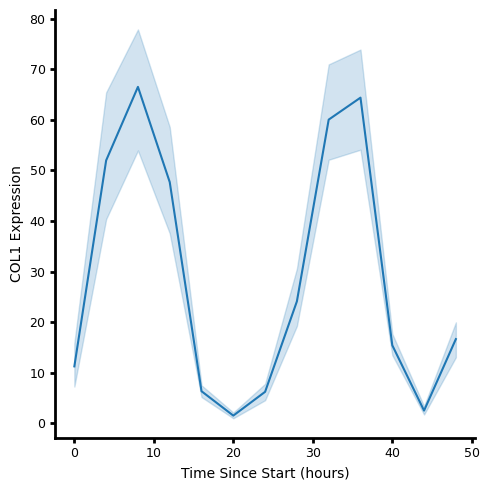

In [33]:
import matplotlib.pyplot as plt
import seaborn as sns

at5g15850_plot_data = pd.DataFrame(
    {
        "Time Since Start": circadian_metadata["Time Since Start"],
        "AT5G15850": circadian_transcriptome["AT5G15850"],
    }
).sort_values("Time Since Start")

fig, ax = plt.subplots(figsize=(5, 5), dpi=100)
fig.patch.set_facecolor("white")
sns.lineplot(
    data=at5g15850_plot_data,
    x="Time Since Start",
    y="AT5G15850",
    errorbar=("ci", 95),
    color="#1f77b4",
    ax=ax,
    sort=True,
    estimator="mean",
)
plt.ylabel("COL1 Expression", fontsize=10)
plt.xlabel("Time Since Start (hours)", fontsize=10)
sns.despine()
ax.spines["bottom"].set_color("black")
ax.spines["bottom"].set_linewidth(2)
ax.spines["left"].set_color("black")
ax.spines["left"].set_linewidth(2)
ax.spines["top"].set_color("black")
ax.spines["top"].set_linewidth(0)
ax.tick_params(axis="both", width=2)
plt.xticks(fontsize=9)
plt.yticks(fontsize=9)
plt.tight_layout()
plt.show()

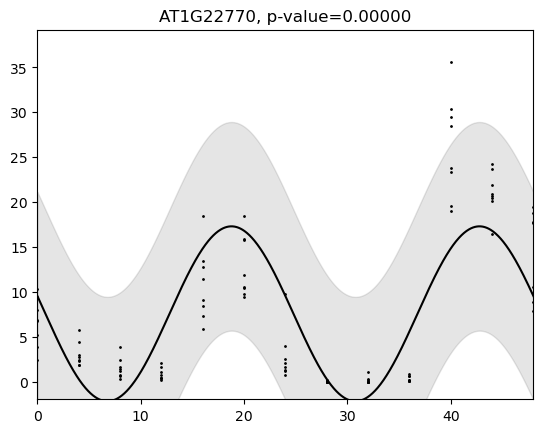

        test  period             p             q  amplitude  p(amplitude)  \
0  AT1G22770    24.0  1.414468e-19  1.414468e-19   9.740839  9.666017e-32   

   q(amplitude)                            CI(amplitude)  acrophase  \
0  9.666017e-32  [8.112333350269887, 11.369344214180826]   1.368229   

   p(acrophase)  q(acrophase)                            CI(acrophase)  \
0  8.820854e-66  8.820854e-66  [1.211682594873138, 1.5247745731761784]   

   acrophase[h]  
0     18.773752  


In [34]:
plot_single_gene_cosinor("AT1G22770")

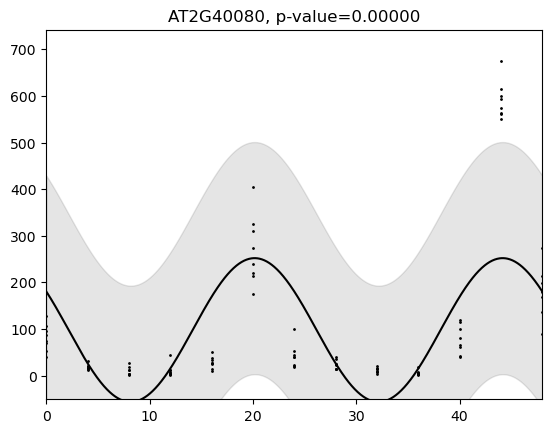

        test  period             p             q   amplitude  p(amplitude)  \
0  AT2G40080    24.0  2.998434e-13  2.998434e-13  154.283431  1.361723e-18   

   q(amplitude)                             CI(amplitude)  acrophase  \
0  1.361723e-18  [119.92300114060063, 188.64386022555826]   1.006574   

   p(acrophase)  q(acrophase)                             CI(acrophase)  \
0  6.631086e-20  6.631086e-20  [0.7905733150987737, 1.2225756324519372]   

   acrophase[h]  
0     20.155169  


In [35]:
plot_single_gene_cosinor("AT2G40080")

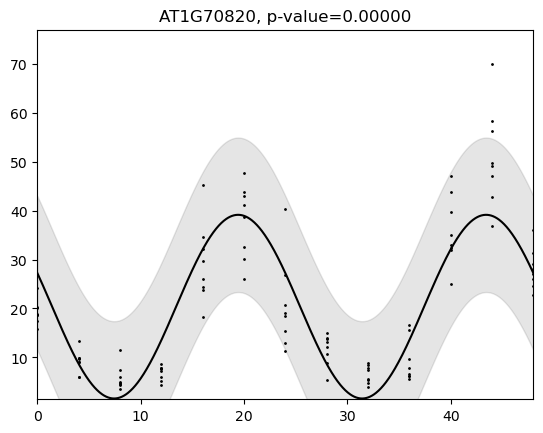

        test  period             p             q  amplitude  p(amplitude)  \
0  AT1G70820    24.0  7.168879e-30  7.168879e-30  18.771798  8.310803e-63   

   q(amplitude)                             CI(amplitude)  acrophase  \
0  8.310803e-63  [16.572258148521325, 20.971336971869956]     1.1998   

   p(acrophase)  q(acrophase)                            CI(acrophase)  \
0  2.467911e-99  2.467911e-99  [1.088642447117776, 1.3109572545999482]   

   acrophase[h]  
0     19.417102  


In [36]:
plot_single_gene_cosinor("AT1G70820")

In [37]:
test_dataframe_cosinor = file_parser.generate_test_data(
    phase=0, n_components=1, name="test1", noise=0.5, replicates=3
)

In [38]:
test_dataframe_cosinor

,test,x,y
0,test1,0.0,0.947839
1,test1,2.0,1.266650
2,test1,4.0,0.731178
3,test1,6.0,-0.245837
4,test1,8.0,-0.219205
...,...,...,...
20,test1,40.0,0.277907
21,test1,42.0,-0.635385
22,test1,44.0,1.283795
23,test1,46.0,0.903858


In [39]:
gene_list = [
    "AT1G02920",
    "AT1G02930",
    "AT1G21110",
    "AT1G21120",
    "AT1G26380",
    "AT1G26410",
    "AT1G26420",
    "AT1G35230",
    "AT1G64170",
    "AT1G65500",
    "AT1G76930",
    "AT2G19190",
    "AT2G25470",
    "AT2G30750",
    "AT2G39200",
    "AT2G43620",
    "AT3G46280",
    "AT4G12490",
    "AT4G12500",
    "AT4G23140",
    "AT4G23220",
    "AT4G28420",
    "AT5G24110",
    "AT5G64120",
]

In [40]:
# Filter to genes in gene_list
filtered_circadian = cosinor_formatted_circadian_transcriptome[
    cosinor_formatted_circadian_transcriptome["test"].isin(gene_list)
].copy()

# Min-max normalize per gene
filtered_circadian["y"] = filtered_circadian.groupby("test")["y"].transform(
    lambda x: (x - x.min()) / (x.max() - x.min())
)

filtered_circadian

,test,x,y
26208,AT1G02920,0.0,0.095814
26209,AT1G02920,0.0,0.152725
26210,AT1G02920,0.0,0.194837
26211,AT1G02920,0.0,0.032671
26212,AT1G02920,0.0,0.175781
...,...,...,...
3889595,AT5G64120,48.0,0.016540
3889596,AT5G64120,32.0,0.001915
3889597,AT5G64120,12.0,0.554046
3889598,AT5G64120,32.0,0.308197


In [41]:
# Filter to genes in gene_list
filtered_circadian_2 = cosinor_formatted_circadian_transcriptome_2[
    cosinor_formatted_circadian_transcriptome_2["test"].isin(gene_list)
].copy()

# Min-max normalize per gene
filtered_circadian_2["y"] = filtered_circadian_2.groupby("test")["y"].transform(
    lambda x: (x - x.min()) / (x.max() - x.min())
)

filtered_circadian_2

,test,x,y
26208,AT1G02920,0.0,0.033225
26209,AT1G02920,0.0,0.166822
26210,AT1G02920,0.0,0.017154
26211,AT1G02920,0.0,0.024670
26212,AT1G02920,0.0,0.011197
...,...,...,...
3889595,AT5G64120,48.0,0.220638
3889596,AT5G64120,48.0,0.032711
3889597,AT5G64120,0.0,0.004603
3889598,AT5G64120,16.0,0.584692


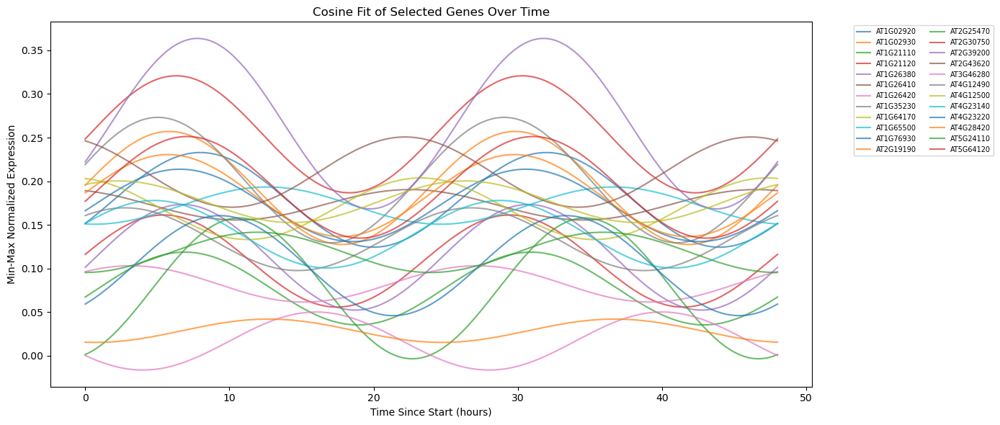

In [42]:
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit


def cosine_model(x, amplitude, phase, offset):
    return amplitude * np.cos(2 * np.pi * x / 24 - phase) + offset


fig, ax = plt.subplots(figsize=(14, 6))
x_fit = np.linspace(filtered_circadian["x"].min(), filtered_circadian["x"].max(), 500)

for gene, group in filtered_circadian.groupby("test"):
    x_data = group["x"].values
    y_data = group["y"].values
    try:
        popt, _ = curve_fit(
            cosine_model, x_data, y_data, p0=[0.5, 0, 0.5], maxfev=10000
        )
        ax.plot(x_fit, cosine_model(x_fit, *popt), label=gene, alpha=0.7)
    except RuntimeError:
        pass  # skip genes where fit doesn't converge

ax.set_xlabel("Time Since Start (hours)")
ax.set_ylabel("Min-Max Normalized Expression")
ax.set_title("Cosine Fit of Selected Genes Over Time")
ax.legend(bbox_to_anchor=(1.05, 1), loc="upper left", fontsize=7, ncol=2)
plt.tight_layout()
plt.show()

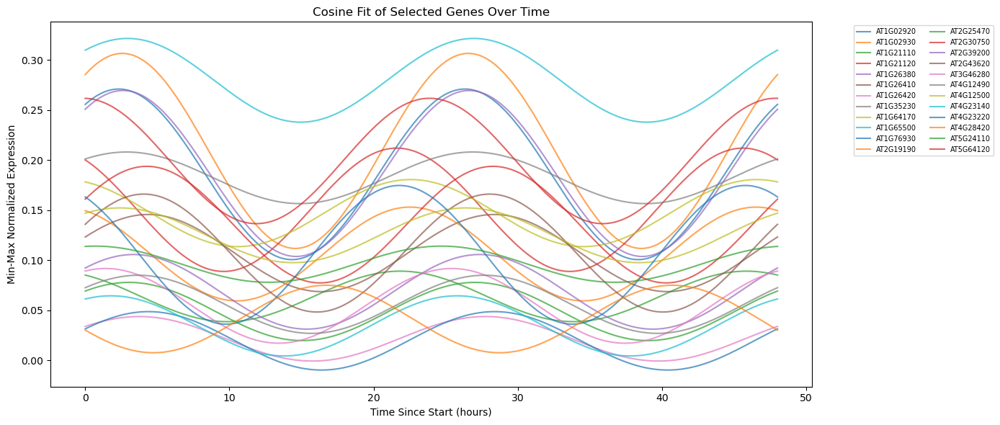

In [43]:
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit


def cosine_model(x, amplitude, phase, offset):
    return amplitude * np.cos(2 * np.pi * x / 24 - phase) + offset


fig, ax = plt.subplots(figsize=(14, 6))
x_fit = np.linspace(
    filtered_circadian_2["x"].min(), filtered_circadian_2["x"].max(), 500
)

for gene, group in filtered_circadian_2.groupby("test"):
    x_data = group["x"].values
    y_data = group["y"].values
    try:
        popt, _ = curve_fit(
            cosine_model, x_data, y_data, p0=[0.5, 0, 0.5], maxfev=10000
        )
        ax.plot(x_fit, cosine_model(x_fit, *popt), label=gene, alpha=0.7)
    except RuntimeError:
        pass  # skip genes where fit doesn't converge

ax.set_xlabel("Time Since Start (hours)")
ax.set_ylabel("Min-Max Normalized Expression")
ax.set_title("Cosine Fit of Selected Genes Over Time")
ax.legend(bbox_to_anchor=(1.05, 1), loc="upper left", fontsize=7, ncol=2)
plt.tight_layout()
plt.show()

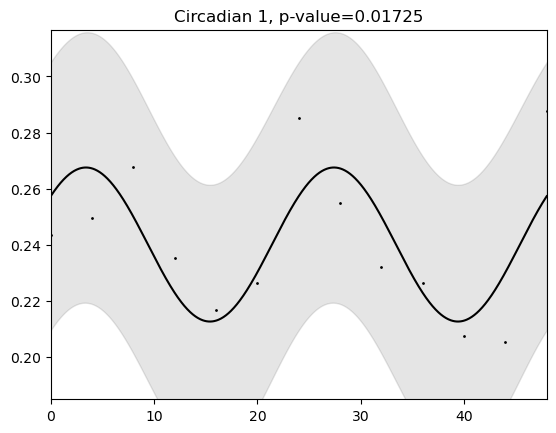

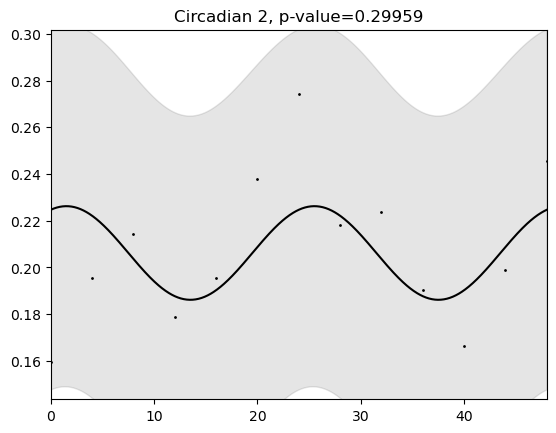

,test,period,p,q,amplitude,p(amplitude),q(amplitude),CI(amplitude),acrophase,p(acrophase),q(acrophase),CI(acrophase),acrophase[h]
0,Circadian 1,24.0,0.017252,0.034504,0.027427,0.000415,0.000831,"[0.012199539871653032, 0.042654565189058656]",-0.892299,0.001383,0.002767,"[-1.4391477270250141, -0.34544976665292504]",3.408330
1,Circadian 2,24.0,0.299592,0.299592,0.020037,0.099162,0.099162,"[-0.0037794778319397287, 0.04385268990504112]",-0.397086,0.533437,0.533437,"[-1.6467876098721175, 0.8526152131270934]",1.516758


In [44]:
def build_defense_average_timecourse(
    transcriptome_df, metadata_df, defense_genes, label
):
    defense_genes_present = transcriptome_df.columns.intersection(defense_genes)
    if len(defense_genes_present) == 0:
        raise ValueError(
            f"No defense genes from the identified list were found for {label}."
        )

    normalized_expression = transcriptome_df.loc[:, defense_genes_present].copy()
    normalized_expression = normalized_expression.apply(
        lambda column: (
            (column - column.min()) / (column.max() - column.min())
            if column.max() > column.min()
            else pd.Series(0.0, index=column.index)
        )
    )

    averaged_samples = normalized_expression.mean(axis=1).rename(
        "mean_normalized_defense_expression"
    )
    averaged_samples = averaged_samples.to_frame().merge(
        metadata_df[["timepoint", "Time Since Start"]],
        left_index=True,
        right_index=True,
    )

    averaged_by_timepoint = (
        averaged_samples.groupby(["timepoint", "Time Since Start"], as_index=False)[
            "mean_normalized_defense_expression"
        ]
        .mean()
        .sort_values("Time Since Start")
    )
    averaged_by_timepoint["test"] = label
    averaged_by_timepoint = averaged_by_timepoint.rename(
        columns={
            "Time Since Start": "x",
            "mean_normalized_defense_expression": "y",
        }
    )

    return averaged_by_timepoint[["test", "x", "y"]]


averaged_defense_timecourse_1 = build_defense_average_timecourse(
    circadian_transcriptome, circadian_metadata, full_defense_gene_list, "Circadian 1"
)
averaged_defense_timecourse_2 = build_defense_average_timecourse(
    circadian_transcriptome_2,
    circadian_metadata_2,
    full_defense_gene_list,
    "Circadian 2",
)

combined_defense_timecourses = pd.concat(
    [averaged_defense_timecourse_1, averaged_defense_timecourse_2],
    ignore_index=True,
)
combined_defense_timecourses

averaged_defense_cosinor_results = cosinor1.fit_group(
    combined_defense_timecourses, period=[24], plot_on=True
)
averaged_defense_cosinor_results

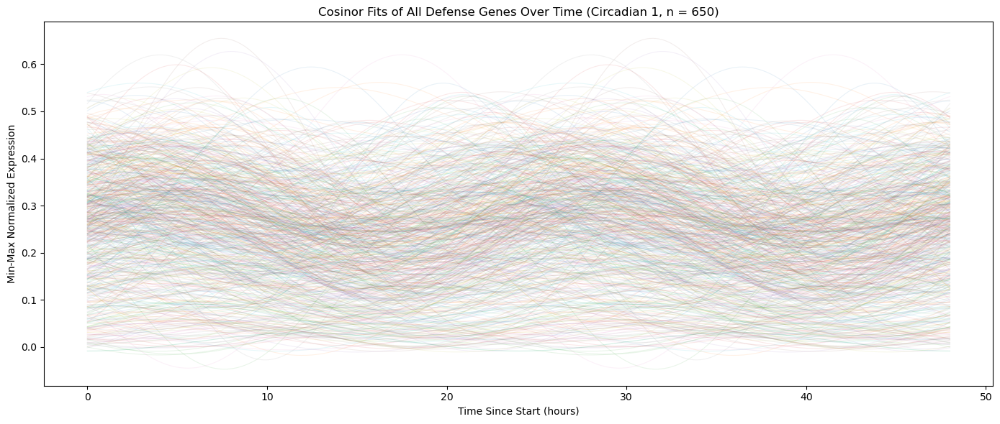

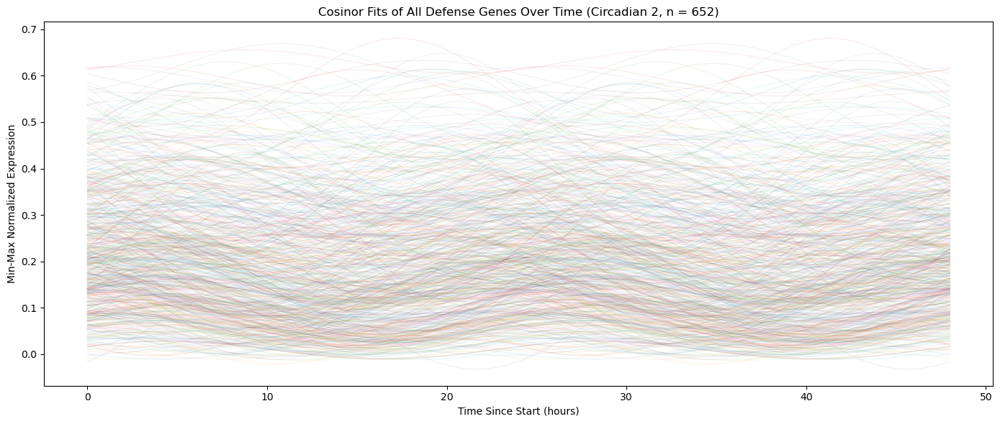

,test,period,p,q,amplitude,p(amplitude),q(amplitude),CI(amplitude),acrophase,p(acrophase),q(acrophase),CI(acrophase),acrophase[h],mesor,experiment
0,AT1G01100,24.0,0.923110,0.933159,0.011386,6.891219e-01,6.966240e-01,"[-0.04439769663747089, 0.06716963223716885]",1.389628,5.522622e-01,6.297727e-01,"[-3.1927089390209726, 5.971964015618974]",18.692014,0.320281,Circadian 1
1,AT1G01183,24.0,0.815568,0.849731,0.014381,5.236975e-01,5.455182e-01,"[-0.029821325735203692, 0.058582792543860084]",-0.909572,5.550106e-01,6.306939e-01,"[-3.929771588369607, 2.110627242399299]",3.474310,0.041356,Circadian 1
2,AT1G01230,24.0,0.162148,0.257064,0.061325,5.486348e-02,8.697869e-02,"[-0.0012779046004831318, 0.12392889610672256]",-0.720695,1.703729e-01,2.412688e-01,"[-1.7509865031886664, 0.30959635811269903]",2.752852,0.371174,Circadian 1
3,AT1G01340,24.0,0.000002,0.000017,0.141508,3.746635e-08,3.634796e-07,"[0.0911028833739965, 0.19191405100420425]",-1.976426,3.180474e-30,6.080318e-29,"[-2.315518423578917, -1.6373332085464654]",7.549391,0.253318,Circadian 1
4,AT1G01580,24.0,0.015250,0.040294,0.074780,3.217793e-03,8.502298e-03,"[0.025031175472810238, 0.12452822797899053]",2.264006,1.399319e-11,9.995136e-11,"[1.6073936961893591, 2.9206180904664474]",15.352135,0.179111,Circadian 1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1297,AT5G67160,24.0,0.082564,0.191632,0.072557,2.384595e-02,5.532940e-02,"[0.009621589709913933, 0.1354931918215061]",-2.852909,1.267192e-09,1.686141e-08,"[-3.773866659672567, -1.931950751101976]",10.897309,0.239183,Circadian 2
1298,AT5G67300,24.0,0.004946,0.031009,0.081151,8.212561e-04,5.198631e-03,"[0.03360896123535368, 0.12869266618067904]",-1.703556,1.017468e-09,1.382060e-08,"[-2.2503221111264677, -1.156789518908831]",6.507104,0.269875,Circadian 2
1299,AT5G67330,24.0,0.202238,0.341604,0.036071,7.182016e-02,1.213128e-01,"[-0.0031999901584638113, 0.07534188300925962]",-1.223199,1.999917e-02,4.776358e-02,"[-2.2537465211197225, -0.192652469864234]",4.672278,0.185497,Circadian 2
1300,AT5G67385,24.0,0.002885,0.023806,0.076075,4.321048e-04,3.566232e-03,"[0.033711652264979075, 0.11843808535345116]",-1.805715,1.252478e-11,2.190454e-10,"[-2.3281724533455104, -1.2832583805349036]",6.897325,0.244498,Circadian 2


In [60]:
# Fit every defense gene with CosinorPy and plot all of the fits together
fit_alpha = 0.1


def fit_all_defense_genes(cosinor_formatted_df, label):
    defense_data = (
        cosinor_formatted_df[cosinor_formatted_df["test"].isin(full_defense_gene_list)]
        .dropna(subset=["y"])
        .copy()
    )

    # Drop flat genes, min-max normalization is undefined for them
    gene_ranges = defense_data.groupby("test")["y"].transform(
        lambda x: x.max() - x.min()
    )
    defense_data = defense_data.loc[gene_ranges > 0].copy()

    # Min-max normalize per gene, matching the selected gene plots above
    defense_data["y"] = defense_data.groupby("test")["y"].transform(
        lambda x: (x - x.min()) / (x.max() - x.min())
    )

    results = cosinor1.fit_group(defense_data, period=[24], plot_on=False)

    # fit_group does not return the MESOR, so refit each gene to recover it
    mesors = {}
    for gene, group in defense_data.groupby("test"):
        fit_results, _amplitude, _acrophase, _statistics = cosinor1.fit_cosinor(
            group["x"].values, group["y"].values, 24, test=gene, plot_on=False
        )
        mesors[gene] = fit_results.params["Intercept"]

    results["mesor"] = results["test"].map(mesors)
    results["experiment"] = label

    return defense_data, results


def plot_all_defense_fits(defense_data, results, label):
    fig, ax = plt.subplots(figsize=(14, 6))
    x_fit = np.linspace(defense_data["x"].min(), defense_data["x"].max(), 500)

    for row in results.itertuples(index=False):
        ax.plot(
            x_fit,
            cosinor1.evaluate_cosinor(
                x_fit, row.mesor, row.amplitude, row.acrophase, row.period
            ),
            alpha=fit_alpha,
            linewidth=0.8,
        )

    ax.set_xlabel("Time Since Start (hours)")
    ax.set_ylabel("Min-Max Normalized Expression")
    ax.set_title(
        f"Cosinor Fits of All Defense Genes Over Time ({label}, n = {len(results)})"
    )
    plt.tight_layout()
    plt.show()


defense_fit_data_1, all_defense_gene_fits_1 = fit_all_defense_genes(
    cosinor_formatted_circadian_transcriptome, "Circadian 1"
)
defense_fit_data_2, all_defense_gene_fits_2 = fit_all_defense_genes(
    cosinor_formatted_circadian_transcriptome_2, "Circadian 2"
)

plot_all_defense_fits(defense_fit_data_1, all_defense_gene_fits_1, "Circadian 1")
plot_all_defense_fits(defense_fit_data_2, all_defense_gene_fits_2, "Circadian 2")

all_defense_gene_fits = pd.concat(
    [all_defense_gene_fits_1, all_defense_gene_fits_2], ignore_index=True
)
all_defense_gene_fits

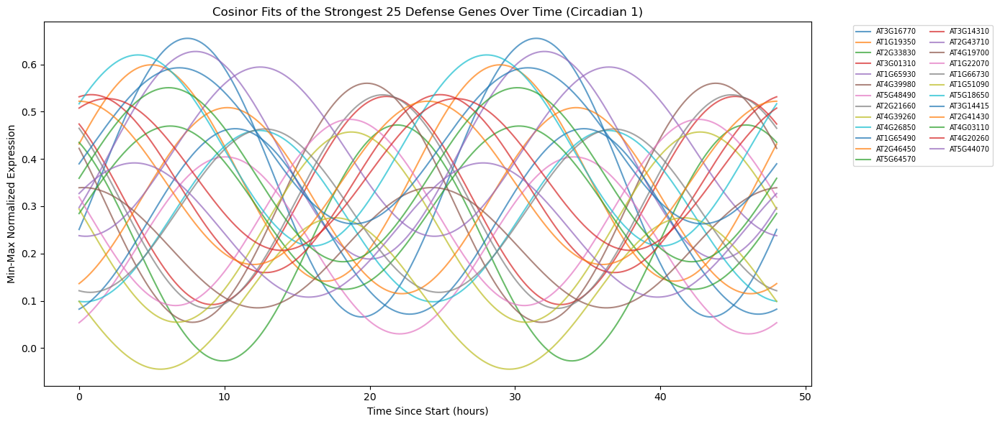

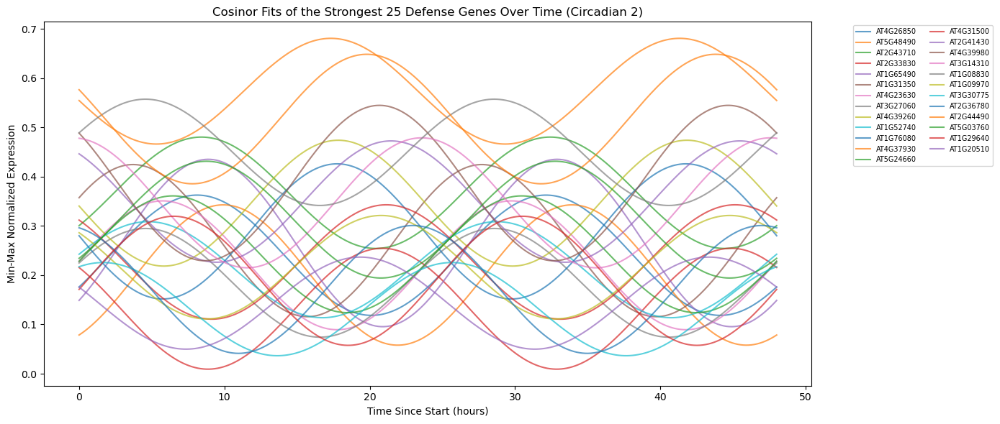

,test,period,p,q,amplitude,p(amplitude),q(amplitude),CI(amplitude),acrophase,p(acrophase),q(acrophase),CI(acrophase),acrophase[h],mesor,experiment
0,AT3G16770,24.0,6.039286e-22,3.925536e-19,0.294553,1.259754e-37,8.188402e-35,"[0.24952269705275348, 0.33958417744238883]",-1.952235,4.386567e-153,2.851269e-150,"[-2.0974129072195433, -1.8070564844189567]",7.456987,0.360398,Circadian 1
1,AT1G19350,24.0,6.175414e-18,2.007009e-15,0.228730,5.731031e-28,1.862585e-25,"[0.18783931586119446, 0.26962112126472276]",-1.299259,8.340292e-52,4.170146e-50,"[-1.4674147578906873, -1.1311029408732547]",4.962803,0.370224,Circadian 1
2,AT2G33830,24.0,1.294817e-17,2.595745e-15,0.249460,3.401971e-27,7.370938e-25,"[0.20419299146254133, 0.29472706808816523]",0.550504,8.573668e-09,4.422924e-08,"[0.36307798893714077, 0.737929414741421]",21.897231,0.222279,Circadian 1
3,AT3G01310,24.0,1.597381e-17,2.595745e-15,0.220104,5.686451e-27,9.240483e-25,"[0.17998802976881456, 0.26021916864974026]",0.745541,1.562066e-15,1.611655e-14,"[0.5622441483537359, 0.9288387080570575]",21.152242,0.312060,Circadian 1
4,AT1G65930,24.0,6.231076e-17,8.100398e-15,0.219488,9.658080e-26,1.255550e-23,"[0.1784766982701174, 0.2604998287645715]",-2.099149,3.960094e-115,3.677230e-113,"[-2.2795482844204713, -1.918750072439357]",8.018159,0.407715,Circadian 1
5,AT4G39980,24.0,8.452731e-17,9.157126e-15,0.252767,1.780228e-25,1.928581e-23,"[0.20527505032583204, 0.3002592161796729]",1.097924,7.136283e-33,1.496317e-31,"[0.917731282612688, 1.2781176737843178]",19.806237,0.307221,Circadian 1
6,AT5G48490,24.0,3.305595e-15,3.069481e-13,0.187138,2.974529e-22,2.762063e-20,"[0.14933045452843272, 0.2249451424039237]",-2.634177,1.004919e-133,2.177324e-131,"[-2.843972020433083, -2.4243829223112736]",10.061817,0.217133,Circadian 1
7,AT2G21660,24.0,9.987501e-15,8.114845e-13,0.225759,2.671407e-21,2.170518e-19,"[0.1790588979428907, 0.27245989580182667]",0.813926,9.686805e-15,9.686805e-14,"[0.6079070260251196, 1.0199445026756984]",20.891033,0.309740,Circadian 1
8,AT4G39260,24.0,5.148433e-14,3.718313e-12,0.201122,4.796005e-20,3.463781e-18,"[0.15812773170361244, 0.24411584734276376]",1.380017,1.172263e-41,3.809856e-40,"[1.179976976609574, 1.5800569881443134]",18.728723,0.255786,Circadian 1
9,AT4G26850,24.0,1.174134e-13,6.746243e-12,0.181141,2.136993e-19,1.389045e-17,"[0.1417198261658103, 0.22056289612393598]",3.044096,4.607303e-144,1.497374e-141,"[2.8106430257165735, 3.277548549474946]",12.372411,0.279059,Circadian 1


In [49]:
# Same plots, but limited to the 25 best-fitting defense genes per experiment
top_gene_count = 25
# The 25 smallest p values are the strongest fits. Flip to True to instead take
# the 25 largest p values, i.e. the weakest fits.
rank_by_weakest_fit = False
fit_alpha = 0.7


def plot_top_defense_fits(defense_data, results, label):
    top_results = results.sort_values("p", ascending=not rank_by_weakest_fit).head(
        top_gene_count
    )

    fig, ax = plt.subplots(figsize=(14, 6))
    x_fit = np.linspace(defense_data["x"].min(), defense_data["x"].max(), 500)

    for row in top_results.itertuples(index=False):
        ax.plot(
            x_fit,
            cosinor1.evaluate_cosinor(
                x_fit, row.mesor, row.amplitude, row.acrophase, row.period
            ),
            label=row.test,
            alpha=fit_alpha,
        )

    ranking_label = "Weakest" if rank_by_weakest_fit else "Strongest"
    ax.set_xlabel("Time Since Start (hours)")
    ax.set_ylabel("Min-Max Normalized Expression")
    ax.set_title(
        f"Cosinor Fits of the {ranking_label} {top_gene_count} Defense Genes Over Time ({label})"
    )
    ax.legend(bbox_to_anchor=(1.05, 1), loc="upper left", fontsize=7, ncol=2)
    plt.tight_layout()
    plt.show()

    return top_results


top_defense_gene_fits_1 = plot_top_defense_fits(
    defense_fit_data_1, all_defense_gene_fits_1, "Circadian 1"
)
top_defense_gene_fits_2 = plot_top_defense_fits(
    defense_fit_data_2, all_defense_gene_fits_2, "Circadian 2"
)

top_defense_gene_fits = pd.concat(
    [top_defense_gene_fits_1, top_defense_gene_fits_2], ignore_index=True
)
top_defense_gene_fits

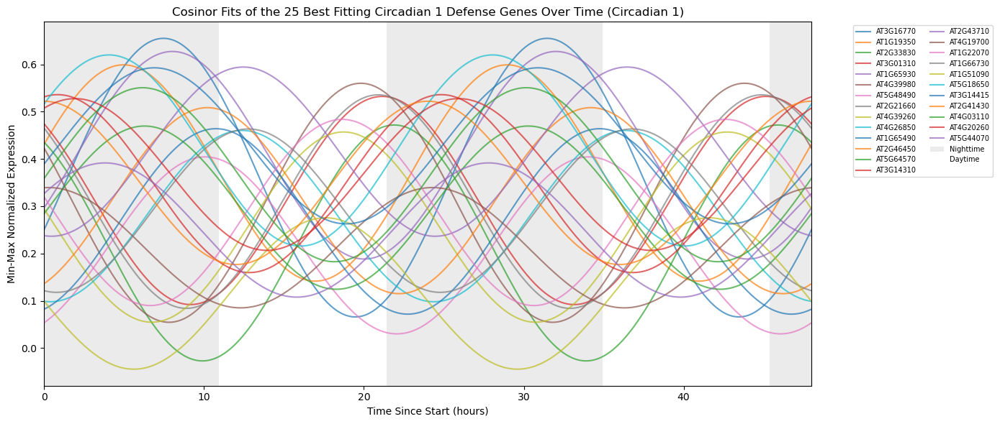

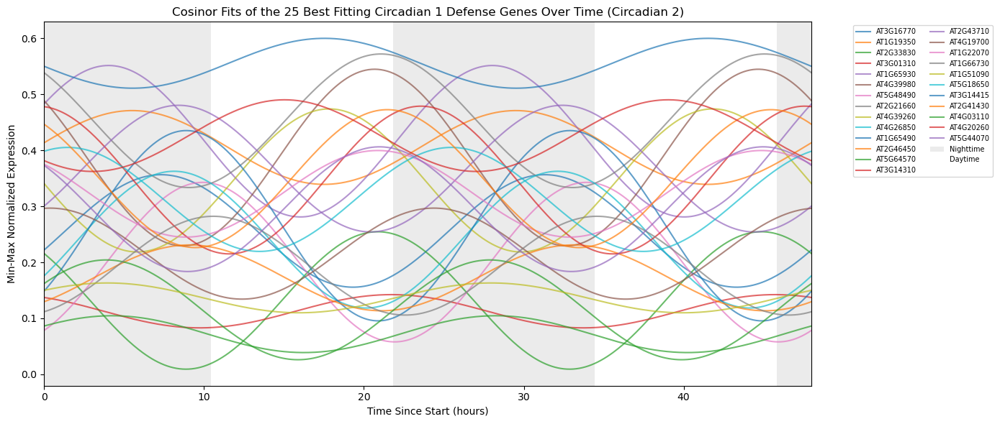

,test,period,p,q,amplitude,p(amplitude),q(amplitude),CI(amplitude),acrophase,p(acrophase),q(acrophase),CI(acrophase),acrophase[h],mesor,experiment
0,AT3G16770,24.0,6.039286e-22,3.925536e-19,0.294553,1.259754e-37,8.188402e-35,"[0.24952269705275348, 0.33958417744238883]",-1.952235,4.386567e-153,2.851269e-150,"[-2.0974129072195433, -1.8070564844189567]",7.456987,0.360398,Circadian 1
1,AT1G19350,24.0,6.175414e-18,2.007009e-15,0.228730,5.731031e-28,1.862585e-25,"[0.18783931586119446, 0.26962112126472276]",-1.299259,8.340292e-52,4.170146e-50,"[-1.4674147578906873, -1.1311029408732547]",4.962803,0.370224,Circadian 1
2,AT2G33830,24.0,1.294817e-17,2.595745e-15,0.249460,3.401971e-27,7.370938e-25,"[0.20419299146254133, 0.29472706808816523]",0.550504,8.573668e-09,4.422924e-08,"[0.36307798893714077, 0.737929414741421]",21.897231,0.222279,Circadian 1
3,AT3G01310,24.0,1.597381e-17,2.595745e-15,0.220104,5.686451e-27,9.240483e-25,"[0.17998802976881456, 0.26021916864974026]",0.745541,1.562066e-15,1.611655e-14,"[0.5622441483537359, 0.9288387080570575]",21.152242,0.312060,Circadian 1
4,AT1G65930,24.0,6.231076e-17,8.100398e-15,0.219488,9.658080e-26,1.255550e-23,"[0.1784766982701174, 0.2604998287645715]",-2.099149,3.960094e-115,3.677230e-113,"[-2.2795482844204713, -1.918750072439357]",8.018159,0.407715,Circadian 1
5,AT4G39980,24.0,8.452731e-17,9.157126e-15,0.252767,1.780228e-25,1.928581e-23,"[0.20527505032583204, 0.3002592161796729]",1.097924,7.136283e-33,1.496317e-31,"[0.917731282612688, 1.2781176737843178]",19.806237,0.307221,Circadian 1
6,AT5G48490,24.0,3.305595e-15,3.069481e-13,0.187138,2.974529e-22,2.762063e-20,"[0.14933045452843272, 0.2249451424039237]",-2.634177,1.004919e-133,2.177324e-131,"[-2.843972020433083, -2.4243829223112736]",10.061817,0.217133,Circadian 1
7,AT2G21660,24.0,9.987501e-15,8.114845e-13,0.225759,2.671407e-21,2.170518e-19,"[0.1790588979428907, 0.27245989580182667]",0.813926,9.686805e-15,9.686805e-14,"[0.6079070260251196, 1.0199445026756984]",20.891033,0.309740,Circadian 1
8,AT4G39260,24.0,5.148433e-14,3.718313e-12,0.201122,4.796005e-20,3.463781e-18,"[0.15812773170361244, 0.24411584734276376]",1.380017,1.172263e-41,3.809856e-40,"[1.179976976609574, 1.5800569881443134]",18.728723,0.255786,Circadian 1
9,AT4G26850,24.0,1.174134e-13,6.746243e-12,0.181141,2.136993e-19,1.389045e-17,"[0.1417198261658103, 0.22056289612393598]",3.044096,4.607303e-144,1.497374e-141,"[2.8106430257165735, 3.277548549474946]",12.372411,0.279059,Circadian 1


In [94]:
# Same plots again, but both panels show the genes that fit best in Circadian 1,
# with daytime shaded light orange and nighttime shaded light blue
top_gene_count = 25
fit_alpha = 0.7
daytime_color = "#FFFFFF"
nighttime_color = "#EBEBEB"

shared_top_genes = (
    all_defense_gene_fits_1.sort_values("p", ascending=True)
    .head(top_gene_count)["test"]
    .tolist()
)

# "Time Since Start" is measured from the first sample of each experiment, so the
# sunrise/sunset clock times are converted into that same coordinate
circadian_1_start = circadian_metadata.sort_values(by="Date and Time")[
    "Date and Time"
].iloc[0]
circadian_2_start = circadian_metadata_2.sort_values(by="Date and Time")[
    "Date and Time"
].iloc[0]


def shade_day_and_night(ax, experiment_start, sunrise, sunset):
    x_min, x_max = ax.get_xlim()
    hour = pd.Timedelta(hours=1)
    # Hours from the experiment start to midnight of the day it started on
    midnight_offset = (experiment_start.normalize() - experiment_start) / hour
    sunrise_offset = pd.to_timedelta(f"{sunrise}:00") / hour
    sunset_offset = pd.to_timedelta(f"{sunset}:00") / hour

    first_day = int(np.floor((x_min - midnight_offset) / 24)) - 1
    last_day = int(np.ceil((x_max - midnight_offset) / 24)) + 1

    already_labelled = set()
    for day in range(first_day, last_day + 1):
        midnight = midnight_offset + 24 * day
        spans = [
            (
                midnight + sunrise_offset,
                midnight + sunset_offset,
                daytime_color,
                "Daytime",
            ),
            (
                midnight + sunset_offset,
                midnight + sunrise_offset + 24,
                nighttime_color,
                "Nighttime",
            ),
        ]
        for span_start, span_end, color, span_label in spans:
            span_start = max(span_start, x_min)
            span_end = min(span_end, x_max)
            if span_end <= span_start:
                continue
            ax.axvspan(
                span_start,
                span_end,
                color=color,
                linewidth=0,
                zorder=0,
                label=span_label if span_label not in already_labelled else None,
            )
            already_labelled.add(span_label)

    ax.set_xlim(x_min, x_max)


def plot_shared_top_defense_fits(
    defense_data, results, label, experiment_start, sunrise, sunset
):
    top_results = results[results["test"].isin(shared_top_genes)].set_index("test")
    missing_genes = [gene for gene in shared_top_genes if gene not in top_results.index]
    if missing_genes:
        print(
            f"{label}: no fit available for {len(missing_genes)} gene(s): {missing_genes}"
        )
    top_results = top_results.loc[
        [gene for gene in shared_top_genes if gene in top_results.index]
    ].reset_index()

    fig, ax = plt.subplots(figsize=(14, 6))
    x_fit = np.linspace(defense_data["x"].min(), defense_data["x"].max(), 500)

    for row in top_results.itertuples(index=False):
        ax.plot(
            x_fit,
            cosinor1.evaluate_cosinor(
                x_fit, row.mesor, row.amplitude, row.acrophase, row.period
            ),
            label=row.test,
            alpha=fit_alpha,
            zorder=2,
        )

    ax.set_xlim(x_fit.min(), x_fit.max())
    shade_day_and_night(ax, experiment_start, sunrise, sunset)

    ax.set_xlabel("Time Since Start (hours)")
    ax.set_ylabel("Min-Max Normalized Expression")
    ax.set_title(
        f"Cosinor Fits of the {top_gene_count} Best Fitting Circadian 1 Defense Genes Over Time ({label})"
    )
    ax.legend(bbox_to_anchor=(1.05, 1), loc="upper left", fontsize=7, ncol=2)
    plt.tight_layout()
    plt.show()

    return top_results


shared_top_defense_gene_fits_1 = plot_shared_top_defense_fits(
    defense_fit_data_1,
    all_defense_gene_fits_1,
    "Circadian 1",
    circadian_1_start,
    c1_sunrise,
    c1_sunset,
)
shared_top_defense_gene_fits_2 = plot_shared_top_defense_fits(
    defense_fit_data_2,
    all_defense_gene_fits_2,
    "Circadian 2",
    circadian_2_start,
    c2_sunrise,
    c2_sunset,
)

shared_top_defense_gene_fits = pd.concat(
    [shared_top_defense_gene_fits_1, shared_top_defense_gene_fits_2], ignore_index=True
)
shared_top_defense_gene_fits

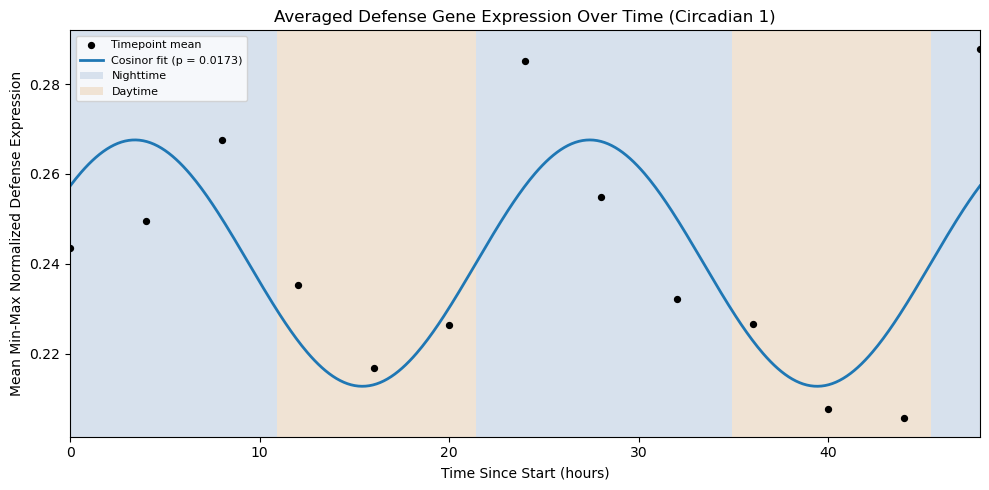

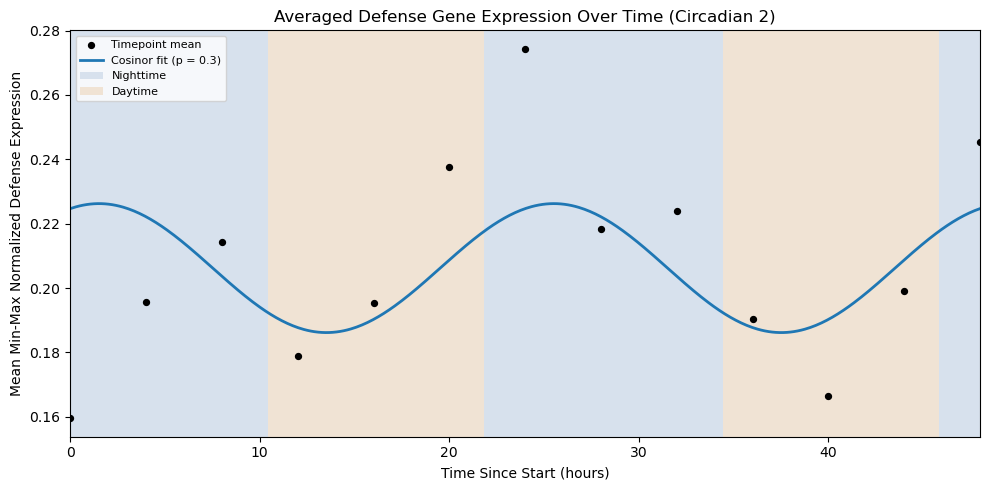

,test,p,amplitude,acrophase,mesor,period
0,Circadian 1,0.017252,0.027427,-0.892299,0.240156,24
1,Circadian 2,0.299592,0.020037,-0.397086,0.206189,24


In [80]:
# The averaged normalized defense expression fits, redrawn with day/night shading.
# CosinorPy draws its own figure, so the fit is recreated here to shade behind it.
def plot_averaged_defense_fit(timecourse, label, experiment_start, sunrise, sunset):
    x_data = timecourse["x"].values
    y_data = timecourse["y"].values

    fit_results, amplitude, acrophase, _statistics = cosinor1.fit_cosinor(
        x_data, y_data, 24, test=label, plot_on=False
    )
    mesor = fit_results.params["Intercept"]

    fig, ax = plt.subplots(figsize=(10, 5))
    x_fit = np.linspace(x_data.min(), x_data.max(), 500)

    ax.scatter(x_data, y_data, color="black", s=18, zorder=3, label="Timepoint mean")
    ax.plot(
        x_fit,
        cosinor1.evaluate_cosinor(x_fit, mesor, amplitude, acrophase, 24),
        color="#1f77b4",
        linewidth=2,
        zorder=2,
        label=f"Cosinor fit (p = {fit_results.f_pvalue:.3g})",
    )

    ax.set_xlim(x_fit.min(), x_fit.max())
    shade_day_and_night(ax, experiment_start, sunrise, sunset)

    ax.set_xlabel("Time Since Start (hours)")
    ax.set_ylabel("Mean Min-Max Normalized Defense Expression")
    ax.set_title(f"Averaged Defense Gene Expression Over Time ({label})")
    ax.legend(fontsize=8)
    plt.tight_layout()
    plt.show()

    return {
        "test": label,
        "p": fit_results.f_pvalue,
        "amplitude": amplitude,
        "acrophase": acrophase,
        "mesor": mesor,
        "period": 24,
    }


shaded_averaged_defense_fits = pd.DataFrame(
    [
        plot_averaged_defense_fit(
            averaged_defense_timecourse_1,
            "Circadian 1",
            circadian_1_start,
            c1_sunrise,
            c1_sunset,
        ),
        plot_averaged_defense_fit(
            averaged_defense_timecourse_2,
            "Circadian 2",
            circadian_2_start,
            c2_sunrise,
            c2_sunset,
        ),
    ]
)
shaded_averaged_defense_fits

In [81]:
# Immunity gene list, built from the immunity GO terms loaded at the top of the notebook
immunity_go_terms = immunity_terms["GO Term ID"].unique()
only_immunity_terms = arabi_go_matrix.loc[
    :, arabi_go_matrix.columns.isin(immunity_go_terms)
]
full_immunity_gene_list = only_immunity_terms.loc[
    only_immunity_terms.any(axis="columns")
].index.to_list()

print(f"Immunity genes: {len(full_immunity_gene_list)}")
print(
    f"Also in the defense gene list: "
    f"{len(set(full_immunity_gene_list) & set(full_defense_gene_list))}"
)

Immunity genes: 444
Also in the defense gene list: 444


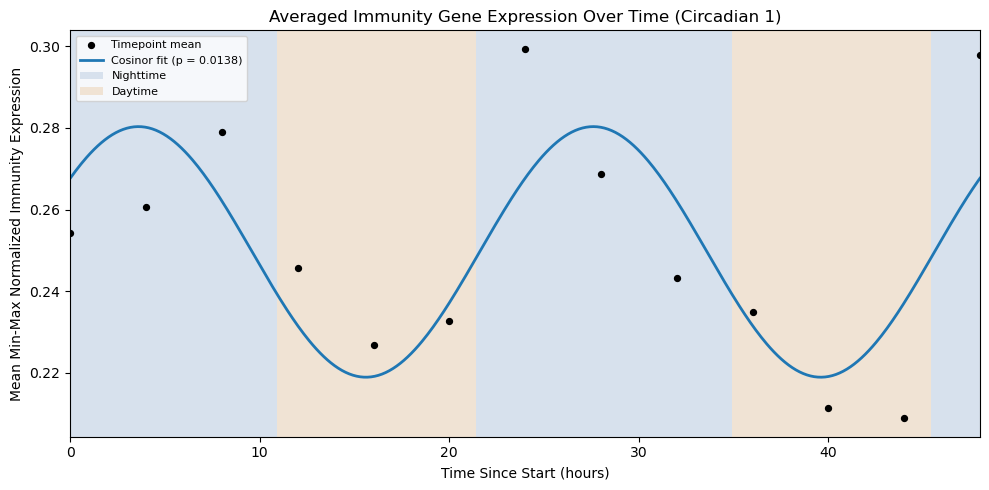

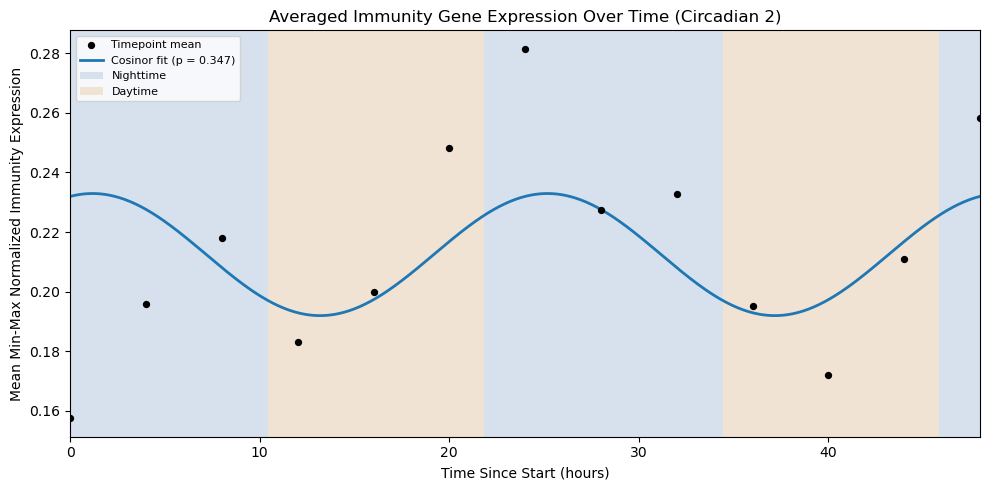

,test,gene_set,p,amplitude,acrophase,mesor,period
0,Circadian 1,Immunity,0.013828,0.030655,-0.941785,0.249626,24
1,Circadian 2,Immunity,0.347192,0.020478,-0.307664,0.212441,24


In [82]:
# Averaged normalized expression fit, immunity genes only, with day/night shading
averaged_immunity_timecourse_1 = build_defense_average_timecourse(
    circadian_transcriptome, circadian_metadata, full_immunity_gene_list, "Circadian 1"
)
averaged_immunity_timecourse_2 = build_defense_average_timecourse(
    circadian_transcriptome_2,
    circadian_metadata_2,
    full_immunity_gene_list,
    "Circadian 2",
)


def plot_averaged_gene_set_fit(
    timecourse, gene_set_label, label, experiment_start, sunrise, sunset
):
    x_data = timecourse["x"].values
    y_data = timecourse["y"].values

    fit_results, amplitude, acrophase, _statistics = cosinor1.fit_cosinor(
        x_data, y_data, 24, test=label, plot_on=False
    )
    mesor = fit_results.params["Intercept"]

    fig, ax = plt.subplots(figsize=(10, 5))
    x_fit = np.linspace(x_data.min(), x_data.max(), 500)

    ax.scatter(x_data, y_data, color="black", s=18, zorder=3, label="Timepoint mean")
    ax.plot(
        x_fit,
        cosinor1.evaluate_cosinor(x_fit, mesor, amplitude, acrophase, 24),
        color="#1f77b4",
        linewidth=2,
        zorder=2,
        label=f"Cosinor fit (p = {fit_results.f_pvalue:.3g})",
    )

    ax.set_xlim(x_fit.min(), x_fit.max())
    shade_day_and_night(ax, experiment_start, sunrise, sunset)

    ax.set_xlabel("Time Since Start (hours)")
    ax.set_ylabel(f"Mean Min-Max Normalized {gene_set_label} Expression")
    ax.set_title(f"Averaged {gene_set_label} Gene Expression Over Time ({label})")
    ax.legend(fontsize=8)
    plt.tight_layout()
    plt.show()

    return {
        "test": label,
        "gene_set": gene_set_label,
        "p": fit_results.f_pvalue,
        "amplitude": amplitude,
        "acrophase": acrophase,
        "mesor": mesor,
        "period": 24,
    }


averaged_immunity_fits = pd.DataFrame(
    [
        plot_averaged_gene_set_fit(
            averaged_immunity_timecourse_1,
            "Immunity",
            "Circadian 1",
            circadian_1_start,
            c1_sunrise,
            c1_sunset,
        ),
        plot_averaged_gene_set_fit(
            averaged_immunity_timecourse_2,
            "Immunity",
            "Circadian 2",
            circadian_2_start,
            c2_sunrise,
            c2_sunset,
        ),
    ]
)
averaged_immunity_fits

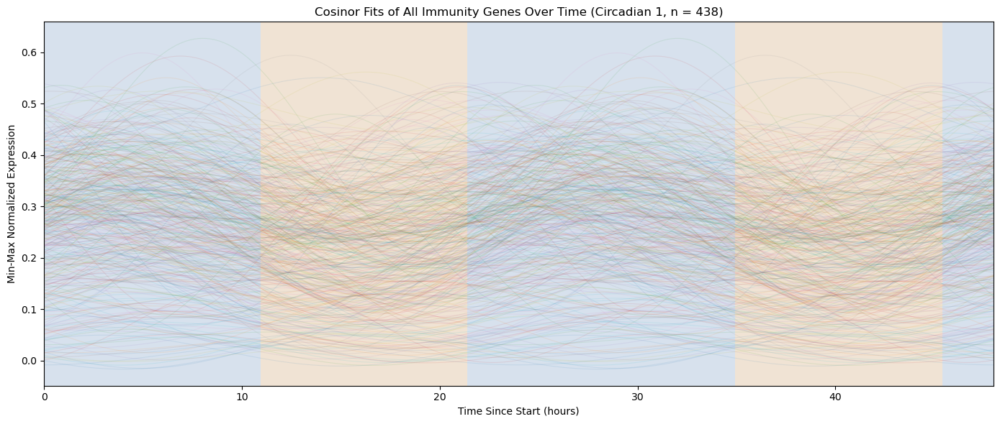

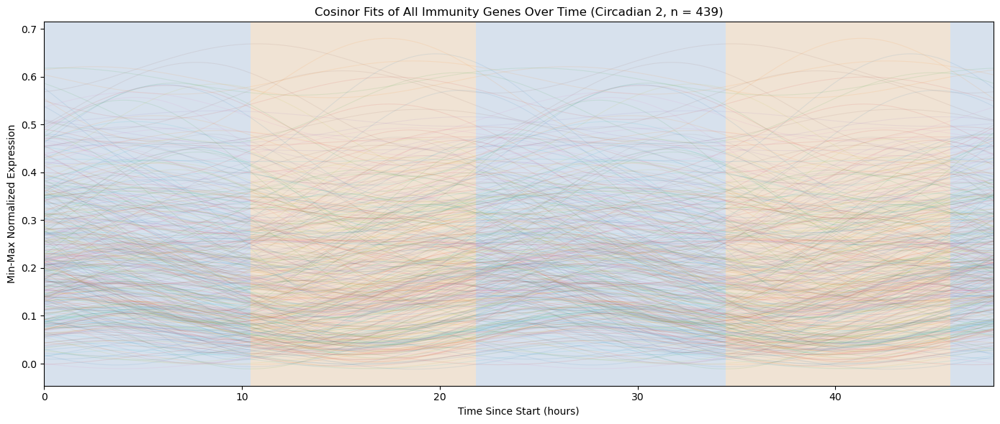

,test,period,p,q,amplitude,p(amplitude),q(amplitude),CI(amplitude),acrophase,p(acrophase),q(acrophase),CI(acrophase),acrophase[h],mesor,experiment
0,AT1G01100,24.0,9.231099e-01,0.933769,0.011386,6.891219e-01,6.970794e-01,"[-0.04439769663747089, 0.06716963223716885]",1.389628,5.522622e-01,6.315688e-01,"[-3.1927089390209726, 5.971964015618974]",18.692014,0.320281,Circadian 1
1,AT1G01230,24.0,1.621483e-01,0.254555,0.061325,5.486348e-02,8.612976e-02,"[-0.0012779046004831318, 0.12392889610672256]",-0.720695,1.703729e-01,2.361498e-01,"[-1.7509865031886664, 0.30959635811269903]",2.752852,0.371174,Circadian 1
2,AT1G02120,24.0,4.360734e-01,0.540747,0.031101,1.966034e-01,2.435453e-01,"[-0.016105358160225115, 0.07830803192569848]",-0.507860,5.276771e-01,6.114353e-01,"[-2.083948820709865, 1.0682280799356707]",1.939884,0.302126,Circadian 1
3,AT1G02205,24.0,8.437129e-08,0.000001,0.150451,6.233658e-10,1.092137e-08,"[0.10277001956045935, 0.1981319708119404]",0.790170,1.008039e-06,4.204962e-06,"[0.4734653402876161, 1.1068740526438015]",20.981774,0.382378,Circadian 1
4,AT1G02450,24.0,4.110406e-01,0.514388,0.020259,1.813546e-01,2.269523e-01,"[-0.009448502375320408, 0.049966546437572465]",-0.557228,4.704772e-01,5.560339e-01,"[-2.0705186866714422, 0.956063164498546]",2.128453,0.039412,Circadian 1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
872,AT5G65210,24.0,3.664948e-03,0.029253,0.099767,5.909284e-04,4.716683e-03,"[0.04285383907279839, 0.15668105326275425]",-0.820502,4.608498e-03,1.434844e-02,"[-1.3881136317880383, -0.25289086515851555]",3.134088,0.294440,Circadian 2
873,AT5G65600,24.0,4.762259e-02,0.129051,0.061855,1.237695e-02,3.354001e-02,"[0.01338501614431311, 0.11032473098271481]",0.457030,2.738154e-01,3.877580e-01,"[-0.3615275506962563, 1.2755877466884753]",22.254274,0.134773,Circadian 2
874,AT5G67300,24.0,4.946184e-03,0.032900,0.081151,8.212561e-04,5.546637e-03,"[0.03360896123535368, 0.12869266618067904]",-1.703556,1.017468e-09,1.488894e-08,"[-2.2503221111264677, -1.156789518908831]",6.507104,0.269875,Circadian 2
875,AT5G67330,24.0,2.022382e-01,0.344118,0.036071,7.182016e-02,1.222056e-01,"[-0.0031999901584638113, 0.07534188300925962]",-1.223199,1.999917e-02,4.645310e-02,"[-2.2537465211197225, -0.192652469864234]",4.672278,0.185497,Circadian 2


In [83]:
# Every immunity gene fitted with CosinorPy, all fits plotted together
immunity_fit_alpha = 0.1


def fit_all_genes_in_list(cosinor_formatted_df, gene_list, label):
    gene_data = (
        cosinor_formatted_df[cosinor_formatted_df["test"].isin(gene_list)]
        .dropna(subset=["y"])
        .copy()
    )

    # Drop flat genes, min-max normalization is undefined for them
    gene_ranges = gene_data.groupby("test")["y"].transform(lambda x: x.max() - x.min())
    gene_data = gene_data.loc[gene_ranges > 0].copy()

    # Min-max normalize per gene, matching the plots above
    gene_data["y"] = gene_data.groupby("test")["y"].transform(
        lambda x: (x - x.min()) / (x.max() - x.min())
    )

    results = cosinor1.fit_group(gene_data, period=[24], plot_on=False)

    # fit_group does not return the MESOR, so refit each gene to recover it
    mesors = {}
    for gene, group in gene_data.groupby("test"):
        fit_results, _amplitude, _acrophase, _statistics = cosinor1.fit_cosinor(
            group["x"].values, group["y"].values, 24, test=gene, plot_on=False
        )
        mesors[gene] = fit_results.params["Intercept"]

    results["mesor"] = results["test"].map(mesors)
    results["experiment"] = label

    return gene_data, results


def plot_all_gene_set_fits(
    gene_data, results, gene_set_label, label, experiment_start, sunrise, sunset
):
    fig, ax = plt.subplots(figsize=(14, 6))
    x_fit = np.linspace(gene_data["x"].min(), gene_data["x"].max(), 500)

    for row in results.itertuples(index=False):
        ax.plot(
            x_fit,
            cosinor1.evaluate_cosinor(
                x_fit, row.mesor, row.amplitude, row.acrophase, row.period
            ),
            alpha=immunity_fit_alpha,
            linewidth=0.8,
            zorder=2,
        )

    ax.set_xlim(x_fit.min(), x_fit.max())
    shade_day_and_night(ax, experiment_start, sunrise, sunset)

    ax.set_xlabel("Time Since Start (hours)")
    ax.set_ylabel("Min-Max Normalized Expression")
    ax.set_title(
        f"Cosinor Fits of All {gene_set_label} Genes Over Time ({label}, n = {len(results)})"
    )
    plt.tight_layout()
    plt.show()


immunity_fit_data_1, all_immunity_gene_fits_1 = fit_all_genes_in_list(
    cosinor_formatted_circadian_transcriptome, full_immunity_gene_list, "Circadian 1"
)
immunity_fit_data_2, all_immunity_gene_fits_2 = fit_all_genes_in_list(
    cosinor_formatted_circadian_transcriptome_2, full_immunity_gene_list, "Circadian 2"
)

plot_all_gene_set_fits(
    immunity_fit_data_1,
    all_immunity_gene_fits_1,
    "Immunity",
    "Circadian 1",
    circadian_1_start,
    c1_sunrise,
    c1_sunset,
)
plot_all_gene_set_fits(
    immunity_fit_data_2,
    all_immunity_gene_fits_2,
    "Immunity",
    "Circadian 2",
    circadian_2_start,
    c2_sunrise,
    c2_sunset,
)

all_immunity_gene_fits = pd.concat(
    [all_immunity_gene_fits_1, all_immunity_gene_fits_2], ignore_index=True
)
all_immunity_gene_fits

In [89]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import numpy as np

# Number of steps in the colormap
n_steps = 256

# Create hue (H), lowered saturation (S), and constant value/brightness (V)
hue = np.linspace(0, 1, n_steps)
saturation = np.full_like(hue, 0.4)  # Lower number = more muted/grayish
value = np.full_like(hue, 0.85)  # Adjust brightness

# Combine into an HSV array and convert to RGB
hsv_array = np.stack((hue, saturation, value), axis=-1)
rgb_array = mcolors.hsv_to_rgb(hsv_array)

# Register as a custom ListedColormap
muted_hsv_cmap = mcolors.ListedColormap(rgb_array, name="muted_hsv")

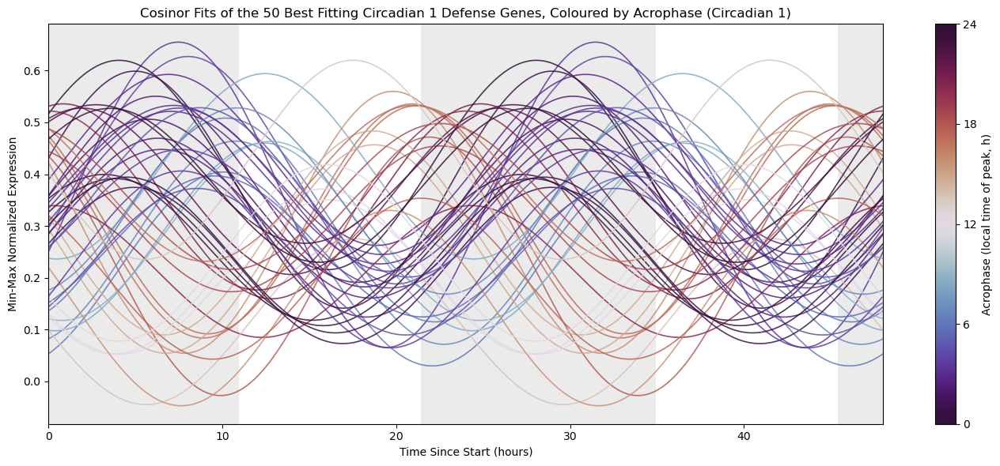

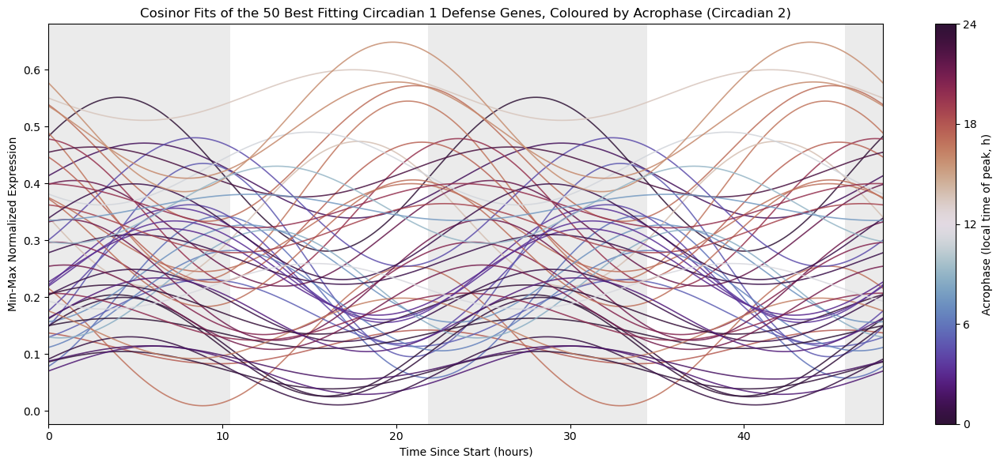

,test,period,p,q,amplitude,p(amplitude),q(amplitude),CI(amplitude),acrophase,p(acrophase),q(acrophase),CI(acrophase),acrophase[h],mesor,experiment,peak_clock_hour
0,AT3G16770,24.0,6.039286e-22,3.925536e-19,0.294553,1.259754e-37,8.188402e-35,"[0.24952269705275348, 0.33958417744238883]",-1.952235,4.386567e-153,2.851269e-150,"[-2.0974129072195433, -1.8070564844189567]",7.456987,0.360398,Circadian 1,3.456987
1,AT1G19350,24.0,6.175414e-18,2.007009e-15,0.228730,5.731031e-28,1.862585e-25,"[0.18783931586119446, 0.26962112126472276]",-1.299259,8.340292e-52,4.170146e-50,"[-1.4674147578906873, -1.1311029408732547]",4.962803,0.370224,Circadian 1,0.962803
2,AT2G33830,24.0,1.294817e-17,2.595745e-15,0.249460,3.401971e-27,7.370938e-25,"[0.20419299146254133, 0.29472706808816523]",0.550504,8.573668e-09,4.422924e-08,"[0.36307798893714077, 0.737929414741421]",21.897231,0.222279,Circadian 1,17.897231
3,AT3G01310,24.0,1.597381e-17,2.595745e-15,0.220104,5.686451e-27,9.240483e-25,"[0.17998802976881456, 0.26021916864974026]",0.745541,1.562066e-15,1.611655e-14,"[0.5622441483537359, 0.9288387080570575]",21.152242,0.312060,Circadian 1,17.152242
4,AT1G65930,24.0,6.231076e-17,8.100398e-15,0.219488,9.658080e-26,1.255550e-23,"[0.1784766982701174, 0.2604998287645715]",-2.099149,3.960094e-115,3.677230e-113,"[-2.2795482844204713, -1.918750072439357]",8.018159,0.407715,Circadian 1,4.018159
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,AT4G03550,24.0,2.338358e-01,3.656137e-01,0.038929,8.597883e-02,1.344321e-01,"[-0.005508665435238813, 0.08336762657378702]",0.081168,8.966738e-01,9.373408e-01,"[-1.1438471986579235, 1.3061825591342058]",23.689962,0.360771,Circadian 2,19.689962
96,AT3G52430,24.0,1.496974e-02,6.379262e-02,0.074164,3.090349e-03,1.330533e-02,"[0.025033223572315327, 0.1232951928841412]",-0.240377,5.044656e-01,6.205878e-01,"[-0.946211101868736, 0.4654571683431574]",0.918172,0.182424,Circadian 2,20.918172
97,AT4G12470,24.0,2.283504e-01,3.596243e-01,0.067746,8.364504e-02,1.317308e-01,"[-0.009009000032538517, 0.1445017636085189]",2.846641,3.478442e-06,2.699934e-05,"[1.644289345505091, 4.04899187261456]",13.126634,0.362501,Circadian 2,9.126634
98,AT1G61340,24.0,3.478828e-01,4.735305e-01,0.040087,1.450647e-01,1.970463e-01,"[-0.013831420110591755, 0.094006018006506]",2.276784,7.925205e-04,3.112791e-03,"[0.9468614231692871, 3.606707323700703]",15.303324,0.219129,Circadian 2,11.303324


In [95]:
# The 50 best fitting Circadian 1 defense genes, coloured by acrophase
top_gene_count_50 = 50
acrophase_fit_alpha = 0.85
acrophase_colormap = plt.get_cmap("twilight_shifted")  # cyclic, so 0 h and 24 h match


top_50_genes = (
    all_defense_gene_fits_1.sort_values("p", ascending=True)
    .head(top_gene_count_50)["test"]
    .tolist()
)


def peak_clock_hour(acrophase_hours, experiment_start):
    """Acrophase is measured from the experiment start, so shift it to local time."""
    start_hour = experiment_start.hour + experiment_start.minute / 60
    return (start_hour + acrophase_hours) % 24


def plot_top_fits_by_acrophase(
    defense_data, results, label, experiment_start, sunrise, sunset
):
    top_results = results[results["test"].isin(top_50_genes)].set_index("test")
    missing_genes = [gene for gene in top_50_genes if gene not in top_results.index]
    if missing_genes:
        print(
            f"{label}: no fit available for {len(missing_genes)} gene(s): {missing_genes}"
        )
    top_results = top_results.loc[
        [gene for gene in top_50_genes if gene in top_results.index]
    ].reset_index()

    top_results["peak_clock_hour"] = top_results["acrophase[h]"].apply(
        lambda hours: peak_clock_hour(hours, experiment_start)
    )

    fig, ax = plt.subplots(figsize=(14, 6))
    x_fit = np.linspace(defense_data["x"].min(), defense_data["x"].max(), 500)
    norm = plt.Normalize(vmin=0, vmax=24)

    for row in top_results.itertuples(index=False):
        ax.plot(
            x_fit,
            cosinor1.evaluate_cosinor(
                x_fit, row.mesor, row.amplitude, row.acrophase, row.period
            ),
            color=acrophase_colormap(norm(row.peak_clock_hour)),
            alpha=acrophase_fit_alpha,
            linewidth=1.2,
            zorder=2,
        )

    ax.set_xlim(x_fit.min(), x_fit.max())
    shade_day_and_night(ax, experiment_start, sunrise, sunset)

    colorbar = fig.colorbar(
        plt.cm.ScalarMappable(norm=norm, cmap=acrophase_colormap),
        ax=ax,
        ticks=[0, 6, 12, 18, 24],
    )
    colorbar.set_label("Acrophase (local time of peak, h)")

    ax.set_xlabel("Time Since Start (hours)")
    ax.set_ylabel("Min-Max Normalized Expression")
    ax.set_title(
        f"Cosinor Fits of the {top_gene_count_50} Best Fitting Circadian 1 Defense Genes, "
        f"Coloured by Acrophase ({label})"
    )
    plt.tight_layout()
    plt.show()

    return top_results


top_50_defense_gene_fits_1 = plot_top_fits_by_acrophase(
    defense_fit_data_1,
    all_defense_gene_fits_1,
    "Circadian 1",
    circadian_1_start,
    c1_sunrise,
    c1_sunset,
)
top_50_defense_gene_fits_2 = plot_top_fits_by_acrophase(
    defense_fit_data_2,
    all_defense_gene_fits_2,
    "Circadian 2",
    circadian_2_start,
    c2_sunrise,
    c2_sunset,
)

top_50_defense_gene_fits = pd.concat(
    [top_50_defense_gene_fits_1, top_50_defense_gene_fits_2], ignore_index=True
)
top_50_defense_gene_fits